In [69]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

from sklearn.cluster import KMeans, MiniBatchKMeans, Birch
from sklearn.datasets import make_blobs
from sklearn.metrics import adjusted_rand_score

import warnings
warnings.filterwarnings("ignore")

## Data processing

In [70]:
train  = pd.read_csv('fashion-mnist_train.csv')

In [71]:
train.shape

(60000, 785)

In [72]:
train.head()

,label,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,...,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
0,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,9,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,6,0,0,0,0,0,0,0,5,0,...,0,0,0,30,43,0,0,0,0,0
3,0,0,0,0,1,2,0,0,0,0,...,3,0,0,0,0,1,0,0,0,0
4,3,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [14]:
train.groupby('label')[].count()

,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,...,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
label,,,,,,,,,,,,,,,,,,,,,
0,6000,6000,6000,6000,6000,6000,6000,6000,6000,6000,...,6000,6000,6000,6000,6000,6000,6000,6000,6000,6000
1,6000,6000,6000,6000,6000,6000,6000,6000,6000,6000,...,6000,6000,6000,6000,6000,6000,6000,6000,6000,6000
2,6000,6000,6000,6000,6000,6000,6000,6000,6000,6000,...,6000,6000,6000,6000,6000,6000,6000,6000,6000,6000
3,6000,6000,6000,6000,6000,6000,6000,6000,6000,6000,...,6000,6000,6000,6000,6000,6000,6000,6000,6000,6000
4,6000,6000,6000,6000,6000,6000,6000,6000,6000,6000,...,6000,6000,6000,6000,6000,6000,6000,6000,6000,6000
5,6000,6000,6000,6000,6000,6000,6000,6000,6000,6000,...,6000,6000,6000,6000,6000,6000,6000,6000,6000,6000
6,6000,6000,6000,6000,6000,6000,6000,6000,6000,6000,...,6000,6000,6000,6000,6000,6000,6000,6000,6000,6000
7,6000,6000,6000,6000,6000,6000,6000,6000,6000,6000,...,6000,6000,6000,6000,6000,6000,6000,6000,6000,6000
8,6000,6000,6000,6000,6000,6000,6000,6000,6000,6000,...,6000,6000,6000,6000,6000,6000,6000,6000,6000,6000


In [73]:
test = pd.read_csv('fashion-mnist_test.csv')

In [74]:
test 

,label,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,...,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
0,0,0,0,0,0,0,0,0,9,8,...,103,87,56,0,0,0,0,0,0,0
1,1,0,0,0,0,0,0,0,0,0,...,34,0,0,0,0,0,0,0,0,0
2,2,0,0,0,0,0,0,14,53,99,...,0,0,0,0,63,53,31,0,0,0
3,2,0,0,0,0,0,0,0,0,0,...,137,126,140,0,133,224,222,56,0,0
4,3,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,0,0,0,0,0,0,0,0,0,0,...,32,23,14,20,0,0,1,0,0,0
9996,6,0,0,0,0,0,0,0,0,0,...,0,0,0,2,52,23,28,0,0,0
9997,8,0,0,0,0,0,0,0,0,0,...,175,172,172,182,199,222,42,0,1,0
9998,8,0,1,3,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0


In [15]:
X = train.copy()
X = X.drop(['label'], axis = 1)
Y = train['label']

In [16]:
for i in X.columns:
        X[i] = X[i]/255

In [17]:
X 

,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,...,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.019608,0.0,0.0,...,0.000000,0.000000,0.000000,0.117647,0.168627,0.000000,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.003922,0.007843,0.0,0.0,0.000000,0.0,0.0,...,0.011765,0.000000,0.000000,0.000000,0.000000,0.003922,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59995,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0
59996,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,...,0.286275,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0
59997,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,...,0.627451,0.635294,0.639216,0.529412,0.368627,0.000000,0.0,0.0,0.0,0.0
59998,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0


In [18]:
train_stand = X.copy()
train_stand['label'] = train['label']

In [22]:
kmeans = KMeans(n_clusters=10, random_state=123)
train['predicted_cluster_kmeans'] = kmeans.fit_predict(X)
train.head()

,label,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,...,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784,predicted_cluster_kmeans
0,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,3
1,9,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2
2,6,0,0,0,0,0,0,0,5,0,...,0,0,30,43,0,0,0,0,0,5
3,0,0,0,0,1,2,0,0,0,0,...,0,0,0,0,1,0,0,0,0,4
4,3,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,4


In [23]:
train_stand['predicted_cluster_kmeans'] = train['predicted_cluster_kmeans']

In [24]:
sample = train_stand.sample(n = 5000, replace = False)
sample_X = sample.copy()
sample_X.drop(['label', 'predicted_cluster_kmeans'], 1, inplace=True)
sample_X

,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,...,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
35560,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.200000,0.294118,...,0.000000,0.000000,0.000000,0.223529,0.400000,0.203922,0.200000,0.000000,0.0,0.0
3331,0.0,0.0,0.0,0.003922,0.0,0.000000,0.000000,0.000000,0.000000,0.078431,...,0.247059,0.227451,0.290196,0.000000,0.282353,0.674510,0.584314,0.223529,0.0,0.0
31055,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
9087,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.003922,0.000000,...,0.000000,0.000000,0.000000,0.509804,0.580392,0.301961,0.000000,0.000000,0.0,0.0
51319,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.203922,...,0.686275,0.345098,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53182,0.0,0.0,0.0,0.000000,0.0,0.000000,0.031373,0.180392,0.411765,0.356863,...,0.435294,0.368627,0.337255,0.290196,0.184314,0.000000,0.000000,0.000000,0.0,0.0
56168,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.294118,0.137255,0.000000,0.423529,0.564706,0.000000,0.000000,0.000000,0.0,0.0
30864,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
43005,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.074510,...,0.141176,0.133333,0.094118,0.054902,0.000000,0.000000,0.000000,0.000000,0.0,0.0


## T-SNE

In [49]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from sklearn.manifold import TSNE
from sklearn.metrics import adjusted_rand_score
from skfuzzy.cluster import cmeans
from sklearn.datasets import load_digits

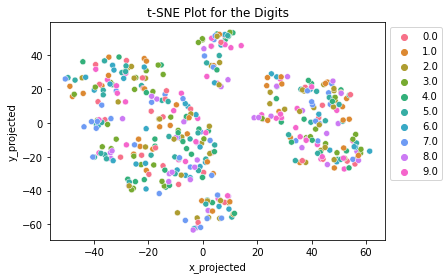

In [23]:
tsne = TSNE(n_components=2, perplexity=50, random_state=89)
data_tsne = tsne.fit_transform(sample_X)
df_tsne = pd.DataFrame(data_tsne, columns=['x_projected', 'y_projected'])
df_combo = pd.concat([sample, df_tsne], axis=1)
sns.scatterplot(x='x_projected',y='y_projected', hue='label', palette=sns.color_palette("husl", 10), data=df_combo)
plt.title('t-SNE Plot for the Digits')
plt.legend(bbox_to_anchor=(1,1))
plt.show()

In [25]:
sample['label'].unique()

array([2, 5, 4, 7, 3, 9, 6, 8, 1, 0])

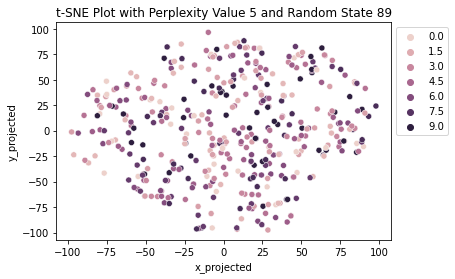

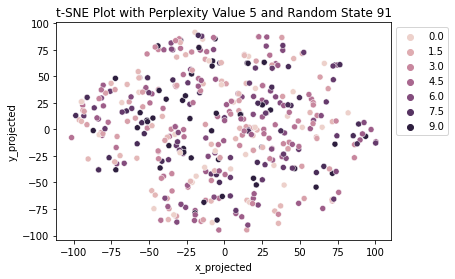

--------------------------------------------


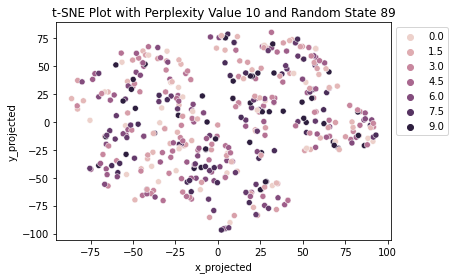

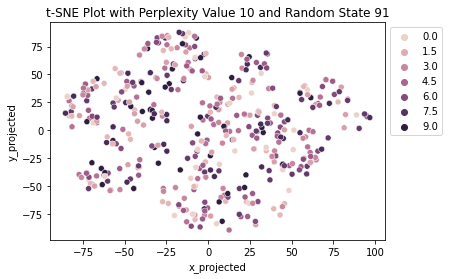

--------------------------------------------


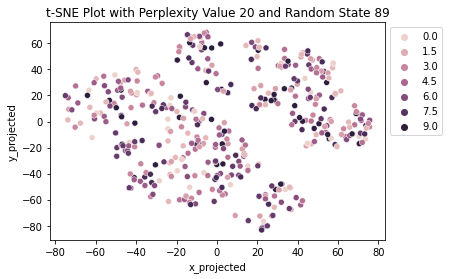

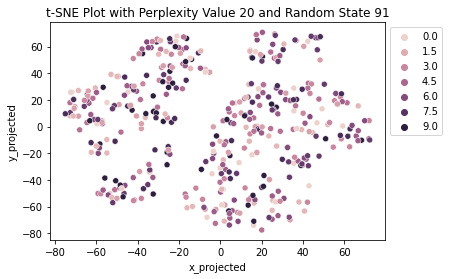

--------------------------------------------


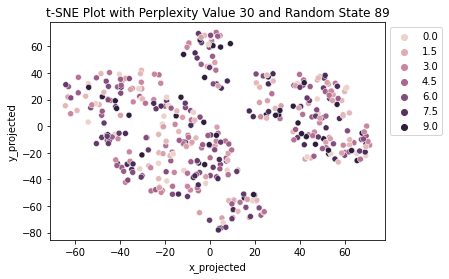

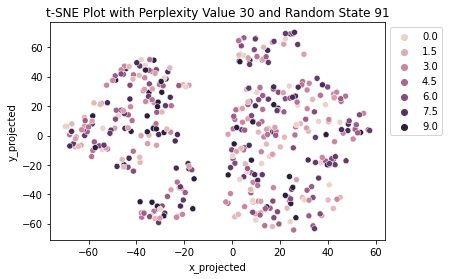

--------------------------------------------


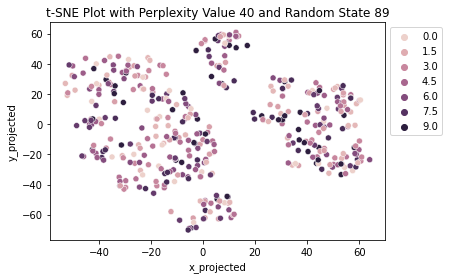

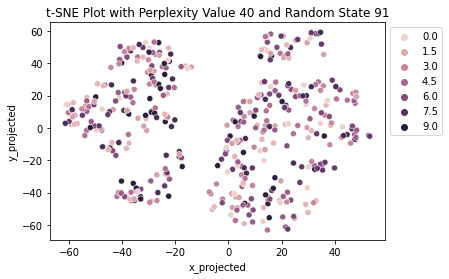

--------------------------------------------


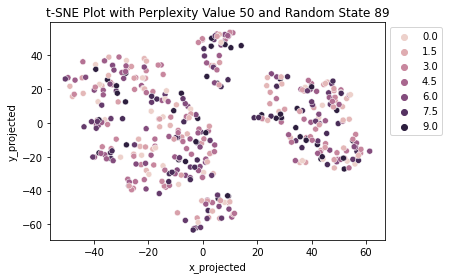

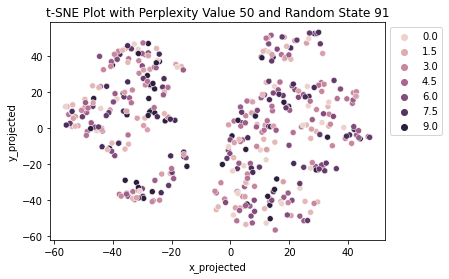

--------------------------------------------


In [24]:
warnings.filterwarnings('ignore')

for perp in [5,10, 20, 30, 40, 50]:
    for rs in [89,91]:
        tsne = TSNE(n_components=2, perplexity=perp, random_state=rs)
        data_tsne = tsne.fit_transform(sample_X)
        df_tsne = pd.DataFrame(data_tsne, columns=['x_projected', 'y_projected'])
        df_combo = pd.concat([sample, df_tsne], axis=1)
        sns.scatterplot(x='x_projected',y='y_projected', hue='label', data=df_combo)
        plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' %(perp, rs))
        plt.legend(bbox_to_anchor=(1,1))
        plt.show()
    print('--------------------------------------------')

## PCA 

In [124]:
from sklearn.datasets import load_digits
from sklearn.decomposition import PCA

from sklearn.preprocessing import StandardScaler

In [125]:
mean_list = np.array(X.mean())
mean_list

array([3.52941176e-06, 2.41176471e-05, 1.38562092e-04, 3.99738562e-04,
       9.72418301e-04, 1.61359477e-03, 3.15986928e-03, 8.62071895e-03,
       2.22823529e-02, 5.68186928e-02, 1.28747386e-01, 1.79337320e-01,
       2.04172876e-01, 1.99225294e-01, 1.97879020e-01, 2.10965556e-01,
       2.01553856e-01, 1.58559739e-01, 1.02287582e-01, 4.08650327e-02,
       1.59990196e-02, 7.60071895e-03, 4.61823529e-03, 3.36464052e-03,
       1.80836601e-03, 9.58039216e-04, 3.63398693e-04, 7.18954248e-05,
       2.50980392e-05, 8.08496732e-05, 3.88104575e-04, 1.40078431e-03,
       3.00869281e-03, 8.25326797e-03, 2.87509150e-02, 6.85188889e-02,
       1.25525556e-01, 2.07116013e-01, 3.11176144e-01, 3.92720327e-01,
       4.43540784e-01, 4.36282484e-01, 4.28074575e-01, 4.50509150e-01,
       4.33559673e-01, 3.56183856e-01, 2.80567908e-01, 1.76600719e-01,
       1.02144183e-01, 5.34702614e-02, 2.43914379e-02, 1.37737908e-02,
       8.66104575e-03, 4.64686275e-03, 1.80026144e-03, 3.28758170e-04,
      

In [126]:
X = StandardScaler(with_std=False).fit_transform(X)
X

array([[-3.52941176e-06, -2.41176471e-05, -1.38562092e-04, ...,
        -1.07972549e-02, -3.35496732e-03, -2.75490196e-04],
       [-3.52941176e-06, -2.41176471e-05, -1.38562092e-04, ...,
        -1.07972549e-02, -3.35496732e-03, -2.75490196e-04],
       [-3.52941176e-06, -2.41176471e-05, -1.38562092e-04, ...,
        -1.07972549e-02, -3.35496732e-03, -2.75490196e-04],
       ...,
       [-3.52941176e-06, -2.41176471e-05, -1.38562092e-04, ...,
        -1.07972549e-02, -3.35496732e-03, -2.75490196e-04],
       [-3.52941176e-06, -2.41176471e-05, -1.38562092e-04, ...,
        -1.07972549e-02, -3.35496732e-03, -2.75490196e-04],
       [-3.52941176e-06, -2.41176471e-05, -1.38562092e-04, ...,
        -1.07972549e-02, -3.35496732e-03, -2.75490196e-04]])

In [127]:
np.round(np.mean(X,axis=0), 6)

array([-0.,  0.,  0.,  0., -0.,  0., -0.,  0.,  0., -0.,  0.,  0., -0.,
       -0., -0.,  0., -0., -0.,  0., -0.,  0., -0.,  0.,  0.,  0., -0.,
        0., -0., -0., -0., -0.,  0., -0.,  0., -0., -0.,  0.,  0.,  0.,
        0., -0.,  0., -0., -0.,  0., -0., -0.,  0., -0.,  0.,  0., -0.,
        0., -0.,  0.,  0., -0., -0.,  0.,  0.,  0.,  0., -0.,  0.,  0.,
       -0.,  0.,  0.,  0.,  0., -0.,  0.,  0.,  0., -0., -0.,  0.,  0.,
       -0., -0.,  0.,  0.,  0.,  0.,  0.,  0., -0.,  0.,  0., -0., -0.,
       -0.,  0., -0., -0.,  0.,  0., -0., -0., -0.,  0.,  0.,  0., -0.,
       -0., -0.,  0.,  0.,  0., -0., -0., -0.,  0., -0., -0.,  0.,  0.,
        0., -0., -0.,  0.,  0.,  0., -0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0., -0.,  0., -0., -0., -0., -0.,  0., -0., -0., -0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0., -0., -0.,  0., -0., -0.,
       -0., -0.,  0.,  0., -0.,  0., -0.,  0., -0.,  0.,  0.,  0., -0.,
        0.,  0., -0., -0.,  0.,  0.,  0., -0.,  0., -0.,  0.,  0

### 2. Descriptive Analytics

### 2.1. Pixel Variability

First, calculate the variance of each of the 784 pixels in your mean-scaled dataset. Display these 784 variances in a histogram.

In [128]:
var = pd.DataFrame(X).var().to_frame().reset_index()
var.rename(columns={'index':'pixel', 0:'variance'}, inplace=True)

In [129]:
var['pixel'] = np.arange(1, 785)
#var.drop('index', 1,inplace=True)
var[['pixel']].astype(int)

,pixel
0,1
1,2
2,3
3,4
4,5
...,...
779,780
780,781
781,782
782,783


In [130]:
total_attribute_variance=pd.DataFrame(X).var().sum()
total_attribute_variance

68.10086211541761

In [131]:
#Note you want to transpose X
C = np.cov(X.T)
print(np.shape(C))

df_covariance=pd.DataFrame(C, columns=['pixel '+str(i) for i in range(0,784)], index=['pixel '+str(i) for i in range(0,784)])
df_covariance

(784, 784)


,pixel 0,pixel 1,pixel 2,pixel 3,pixel 4,pixel 5,pixel 6,pixel 7,pixel 8,pixel 9,...,pixel 774,pixel 775,pixel 776,pixel 777,pixel 778,pixel 779,pixel 780,pixel 781,pixel 782,pixel 783
pixel 0,1.378855e-07,1.175639e-07,1.202358e-07,1.664761e-07,1.670180e-07,2.224261e-07,1.446874e-07,2.507520e-07,3.342801e-07,2.974957e-09,...,-5.376781e-08,3.290490e-07,2.814948e-07,6.204143e-08,-1.740386e-07,-1.605102e-07,-4.642958e-09,2.220521e-07,3.595605e-07,1.287235e-07
pixel 1,1.175639e-07,1.129515e-06,2.929425e-06,1.418039e-06,9.756667e-07,8.071822e-07,7.793727e-07,1.005997e-06,1.668704e-06,1.742089e-06,...,1.179636e-07,9.888792e-07,1.191595e-06,3.817004e-07,-9.572548e-07,-4.406936e-07,5.274691e-07,1.030911e-06,8.305442e-07,1.963579e-07
pixel 2,1.202358e-07,2.929425e-06,2.297695e-05,1.786545e-05,9.564253e-06,9.577422e-06,9.408788e-06,9.516150e-06,1.330361e-05,1.551168e-05,...,1.095857e-05,1.537602e-05,1.448643e-05,5.099867e-06,-3.726427e-06,-1.273979e-06,3.818661e-06,4.301239e-06,1.749434e-06,6.256852e-07
pixel 3,1.664761e-07,1.418039e-06,1.786545e-05,9.252713e-05,9.312046e-05,7.170015e-05,7.528972e-05,7.493584e-05,7.660153e-05,7.387838e-05,...,2.102074e-05,3.445707e-05,3.701283e-05,2.772686e-05,1.892780e-05,1.719351e-05,2.674652e-05,8.132858e-06,1.085411e-06,6.754825e-07
pixel 4,1.670180e-07,9.756667e-07,9.564253e-06,9.312046e-05,2.852670e-04,2.678425e-04,2.304805e-04,2.152244e-04,2.150548e-04,1.919515e-04,...,6.855408e-05,1.007589e-04,1.099641e-04,8.282890e-05,6.694361e-05,6.430991e-05,5.094895e-05,3.325992e-05,1.421801e-05,1.003175e-06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
pixel 779,-1.605102e-07,-4.406936e-07,-1.273979e-06,1.719351e-05,6.430991e-05,1.309081e-04,1.541490e-04,1.899809e-04,4.107712e-04,7.868943e-04,...,-2.971721e-03,-3.094900e-04,1.247874e-03,1.027853e-02,2.843416e-02,3.134898e-02,1.541235e-02,4.216126e-03,1.160340e-03,1.083409e-04
pixel 780,-4.642958e-09,5.274691e-07,3.818661e-06,2.674652e-05,5.094895e-05,1.025012e-04,1.139813e-04,1.683424e-04,3.705610e-04,6.945847e-04,...,-1.109887e-03,1.903528e-04,8.678891e-04,2.618773e-03,1.036899e-02,1.541235e-02,1.348773e-02,5.117104e-03,1.425559e-03,1.295622e-04
pixel 781,2.220521e-07,1.030911e-06,4.301239e-06,8.132858e-06,3.325992e-05,6.889402e-05,6.474565e-05,8.568488e-05,1.335301e-04,1.713312e-04,...,-4.321636e-05,4.453197e-04,8.305010e-04,1.089945e-03,2.114385e-03,4.216126e-03,5.117104e-03,4.654799e-03,1.649701e-03,1.282617e-04
pixel 782,3.595605e-07,8.305442e-07,1.749434e-06,1.085411e-06,1.421801e-05,2.587151e-05,1.906278e-05,1.204170e-05,2.530500e-07,-6.111825e-05,...,1.571386e-05,1.865069e-04,3.273705e-04,4.911544e-04,7.537820e-04,1.160340e-03,1.425559e-03,1.649701e-03,1.346447e-03,1.382489e-04


In [132]:
l, v = np.linalg.eig(C)
print('Eigenvalues of the the Covariance Matrix')
print(np.round(l,3))

print('Sorted Eigenvalues of the Covariance Matrix')
l_sort=np.sort(l)[::-1]
print(np.round(l_sort,3))

sort_order=np.argsort(l)[::-1]

print('Eigenvectors of the Covariance Matrix (sorted by the order of their corresponding eigenvalues)')
print('Eigenvectors of the the Covariance Matrix')
print(v[sort_order])

Eigenvalues of the the Covariance Matrix
[1.9757e+01 1.2073e+01 4.1020e+00 3.3850e+00 2.6150e+00 2.3640e+00
 1.5960e+00 1.3030e+00 9.1500e-01 8.9300e-01 6.7400e-01 6.2200e-01
 5.2100e-01 4.5000e-01 4.1500e-01 4.0300e-01 3.7600e-01 3.6100e-01
 3.1300e-01 3.1000e-01 2.9500e-01 2.7700e-01 2.6100e-01 2.5500e-01
 2.4600e-01 2.3900e-01 2.2700e-01 2.1700e-01 2.1100e-01 2.0100e-01
 1.8800e-01 1.8100e-01 1.7900e-01 1.7500e-01 1.6900e-01 1.6200e-01
 1.5700e-01 1.5300e-01 1.4900e-01 1.4300e-01 1.3700e-01 1.3500e-01
 1.3200e-01 1.2500e-01 1.2000e-01 1.1700e-01 1.1400e-01 1.1200e-01
 1.1000e-01 1.0600e-01 1.0500e-01 1.0300e-01 1.0100e-01 9.7000e-02
 9.4000e-02 9.3000e-02 8.9000e-02 8.8000e-02 8.7000e-02 8.6000e-02
 8.4000e-02 8.2000e-02 8.0000e-02 7.9000e-02 7.9000e-02 7.6000e-02
 7.6000e-02 7.5000e-02 7.2000e-02 7.1000e-02 7.1000e-02 7.0000e-02
 6.6000e-02 6.5000e-02 6.4000e-02 6.4000e-02 6.4000e-02 6.2000e-02
 6.1000e-02 5.9000e-02 5.8000e-02 5.7000e-02 5.6000e-02 5.5000e-02
 5.6000e-02 5.5000e-0

In [133]:
all_loading_vectors_df=pd.DataFrame(v[sort_order], columns=['loading vector '+str(i) for i in range(0,784)])
all_loading_vectors_df

,loading vector 0,loading vector 1,loading vector 2,loading vector 3,loading vector 4,loading vector 5,loading vector 6,loading vector 7,loading vector 8,loading vector 9,...,loading vector 774,loading vector 775,loading vector 776,loading vector 777,loading vector 778,loading vector 779,loading vector 780,loading vector 781,loading vector 782,loading vector 783
0,3.205205e-07,-5.166940e-08,-4.017800e-07,3.246764e-07,1.723017e-07,0.000001,4.489089e-07,6.772111e-07,0.000003,-0.000003,...,-0.000005,0.000005,0.000004,0.000006,0.000005,0.000010,-0.000012,0.000005,7.013610e-07,-6.282011e-08
1,2.316686e-06,2.931424e-06,-1.928467e-07,1.285656e-05,-2.663364e-07,0.000012,1.314663e-05,5.295910e-06,0.000005,-0.000013,...,-0.000115,0.000025,0.000351,0.000007,-0.000152,0.000192,-0.000152,0.000152,-2.258327e-04,-2.595400e-04
2,1.811713e-05,7.861429e-06,-1.514942e-05,6.020093e-05,-2.711331e-07,0.000124,8.963949e-05,1.531004e-05,0.000001,-0.000049,...,-0.001001,-0.001569,0.001877,0.000645,-0.000967,0.001693,-0.001072,0.002405,-1.070078e-03,-3.978492e-04
3,6.036144e-05,4.348094e-05,-7.476880e-05,1.474760e-04,-1.958527e-05,0.000300,2.876692e-04,-1.986035e-05,-0.000066,-0.000183,...,-0.004010,-0.004098,0.002421,-0.000649,-0.002803,0.003950,-0.005817,0.004705,2.094758e-03,-3.631370e-03
4,1.338388e-04,9.860734e-05,-1.722399e-04,2.799258e-04,-7.552724e-05,0.000610,7.890862e-04,-4.490029e-05,-0.000023,-0.000461,...,-0.009888,-0.005654,0.009332,-0.010329,-0.010436,-0.003378,-0.011712,0.003301,1.162660e-02,-1.023108e-02
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
779,3.781247e-02,-3.347088e-03,2.090298e-02,-8.691436e-02,2.524006e-02,-0.006244,3.197161e-02,-2.448166e-02,0.012074,-0.001572,...,-0.015849,-0.001061,-0.003532,0.006858,-0.001586,0.008021,-0.003015,-0.001556,3.035511e-03,-2.660564e-03
780,4.118159e-02,-8.160642e-03,-4.812471e-03,-8.894585e-02,4.065275e-02,0.000037,3.817790e-02,-1.081381e-02,-0.004761,-0.016156,...,0.019211,0.006816,-0.003736,-0.008186,-0.004240,-0.016766,0.015089,-0.006321,1.071686e-03,-5.056027e-03
781,4.157916e-02,9.258148e-03,-4.252355e-02,-6.704433e-02,6.343420e-02,0.038368,2.495046e-02,-6.784165e-03,-0.029152,-0.031404,...,-0.021062,-0.008275,0.005456,0.018316,0.000833,0.024799,-0.027390,0.014630,1.954897e-03,8.392700e-04
782,3.393450e-02,2.444172e-02,-6.192857e-02,-4.880501e-02,8.535914e-02,0.054055,-2.244619e-03,-3.188671e-03,-0.005119,-0.086468,...,0.026852,0.001453,-0.012244,-0.023177,0.014205,-0.018728,0.049309,-0.021465,-9.337811e-03,7.380151e-03


In [134]:
cumvar=np.round(np.cumsum(l_sort)/np.sum(l_sort), 3)
cumvar

array([0.29 , 0.467, 0.528, 0.577, 0.616, 0.65 , 0.674, 0.693, 0.706,
       0.72 , 0.729, 0.739, 0.746, 0.753, 0.759, 0.765, 0.77 , 0.776,
       0.78 , 0.785, 0.789, 0.793, 0.797, 0.801, 0.804, 0.808, 0.811,
       0.814, 0.818, 0.82 , 0.823, 0.826, 0.829, 0.831, 0.834, 0.836,
       0.838, 0.841, 0.843, 0.845, 0.847, 0.849, 0.851, 0.853, 0.854,
       0.856, 0.858, 0.859, 0.861, 0.863, 0.864, 0.866, 0.867, 0.868,
       0.87 , 0.871, 0.873, 0.874, 0.875, 0.876, 0.878, 0.879, 0.88 ,
       0.881, 0.882, 0.883, 0.885, 0.886, 0.887, 0.888, 0.889, 0.89 ,
       0.891, 0.892, 0.893, 0.894, 0.895, 0.895, 0.896, 0.897, 0.898,
       0.899, 0.9  , 0.901, 0.901, 0.902, 0.903, 0.904, 0.904, 0.905,
       0.906, 0.907, 0.907, 0.908, 0.909, 0.91 , 0.91 , 0.911, 0.912,
       0.912, 0.913, 0.914, 0.914, 0.915, 0.916, 0.916, 0.917, 0.917,
       0.918, 0.919, 0.919, 0.92 , 0.92 , 0.921, 0.921, 0.922, 0.922,
       0.923, 0.923, 0.924, 0.925, 0.925, 0.926, 0.926, 0.927, 0.927,
       0.927, 0.928,

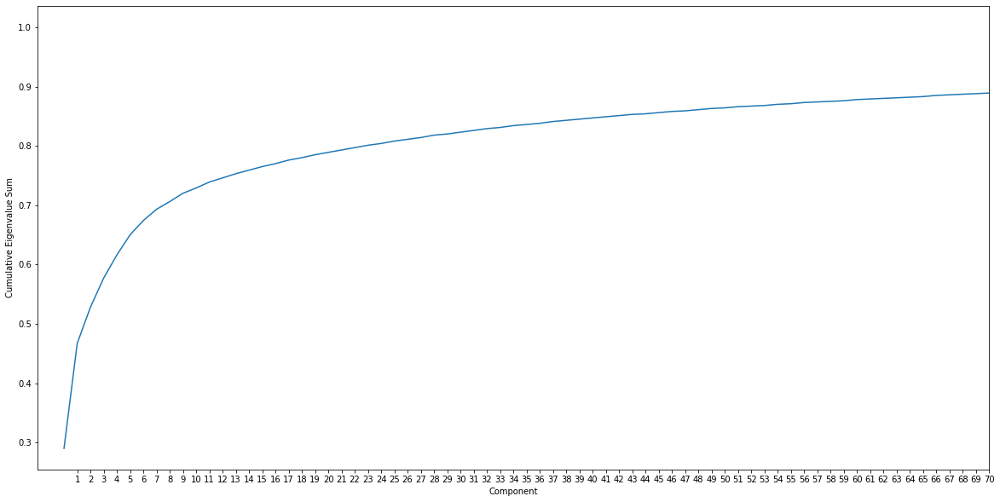

In [135]:
plt.figure(figsize=(20,10))
plt.plot(cumvar)
plt.xticks(range(1,150))
plt.xlim((-2, 70))
plt.ylabel('Cumulative Eigenvalue Sum')
plt.xlabel('Component')
plt.show()

In [150]:
cumvar[25]

0.808

In [137]:
pca = PCA(n_components=25, random_state=1000)
Y = pca.fit_transform(X)

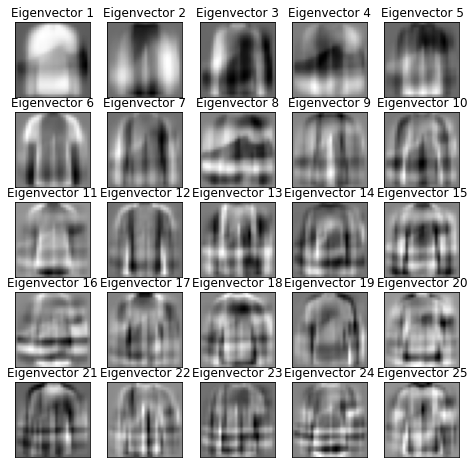

In [138]:
fig, ax = plt.subplots(5, 5, figsize=(8, 8))
for i in range(0,25):
    ax[int(np.floor(i/5)),int(i-5*np.floor(i/5))].set_title('Eigenvector %s'%str(i+1))
    ax[int(np.floor(i/5)),int(i-5*np.floor(i/5))].imshow(pca.components_[i].reshape((28, 28)), cmap='gray')
    ax[int(np.floor(i/5)),int(i-5*np.floor(i/5))].set_xticks([])
    ax[int(np.floor(i/5)),int(i-5*np.floor(i/5))].set_yticks([])
plt.show()

In [139]:
pca.components_

array([[ 3.20520499e-07,  2.31668579e-06,  1.81171337e-05, ...,
         1.11111748e-03,  9.85641062e-05,  1.08814900e-05],
       [-5.16694022e-08,  2.93142370e-06,  7.86142888e-06, ...,
         2.43242483e-03,  7.57989986e-04,  6.57761867e-05],
       [ 4.01780021e-07,  1.92846731e-07,  1.51494164e-05, ...,
        -5.52479996e-04, -1.01539671e-03, -7.41257891e-05],
       ...,
       [-2.58550548e-07,  1.18149672e-06, -5.40474271e-05, ...,
        -2.97238775e-04,  1.81889360e-04,  2.57397208e-04],
       [-3.08443684e-06, -1.41560489e-05, -1.58213171e-05, ...,
         8.47343590e-03,  3.14665877e-03,  1.61834698e-04],
       [ 6.54513750e-07,  6.76911017e-06, -4.14395624e-05, ...,
        -1.25090903e-03, -4.22485070e-04, -1.72404892e-04]])

In [140]:
orig_X=X+mean_list
orig_X

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [141]:
X

array([[-3.52941176e-06, -2.41176471e-05, -1.38562092e-04, ...,
        -1.07972549e-02, -3.35496732e-03, -2.75490196e-04],
       [-3.52941176e-06, -2.41176471e-05, -1.38562092e-04, ...,
        -1.07972549e-02, -3.35496732e-03, -2.75490196e-04],
       [-3.52941176e-06, -2.41176471e-05, -1.38562092e-04, ...,
        -1.07972549e-02, -3.35496732e-03, -2.75490196e-04],
       ...,
       [-3.52941176e-06, -2.41176471e-05, -1.38562092e-04, ...,
        -1.07972549e-02, -3.35496732e-03, -2.75490196e-04],
       [-3.52941176e-06, -2.41176471e-05, -1.38562092e-04, ...,
        -1.07972549e-02, -3.35496732e-03, -2.75490196e-04],
       [-3.52941176e-06, -2.41176471e-05, -1.38562092e-04, ...,
        -1.07972549e-02, -3.35496732e-03, -2.75490196e-04]])

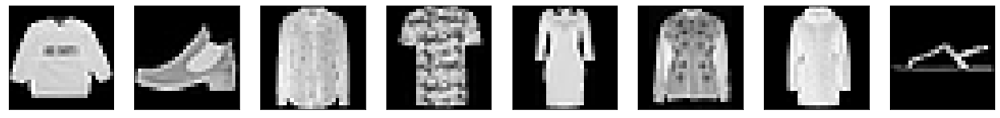

In [142]:
#Let's check the first 10 objects in our original dataset X look like
fig, ax = plt.subplots(1, 8, figsize=(22, 6))

for i in range(8):
    ax[i].imshow(orig_X[i].reshape((28, 28)), cmap='gray')
    ax[i].set_xticks([])
    ax[i].set_yticks([])

plt.show()



In [143]:
np.shape(Y)

(60000, 25)

In [144]:
df_Y=pd.DataFrame(Y, columns=['principal component '+str(i) for i in range(0,25)])
df_Y

,principal component 0,principal component 1,principal component 2,principal component 3,principal component 4,principal component 5,principal component 6,principal component 7,principal component 8,principal component 9,...,principal component 15,principal component 16,principal component 17,principal component 18,principal component 19,principal component 20,principal component 21,principal component 22,principal component 23,principal component 24
0,3.686333,4.960529,-0.051232,-2.733349,0.391787,1.149178,0.875894,2.567449,1.114392,0.786252,...,-1.409641,0.338943,-1.658081,-0.385257,-1.007255,0.171667,-0.872961,-0.203561,-0.409747,1.063463
1,-4.376434,3.861059,-1.949433,-0.803178,0.451490,-0.779967,-1.230174,1.014531,-1.412429,-0.985628,...,0.855729,0.074543,-0.022143,0.577323,-0.043187,0.049710,0.106320,-0.023054,-0.339579,0.491939
2,7.265152,1.568757,2.315239,0.222004,1.048076,-1.161953,-1.070445,-0.301790,0.431265,-0.090304,...,0.671501,-0.454667,-0.427012,0.848331,-0.208811,0.014344,-0.116285,0.013913,-0.050179,0.508678
3,3.227788,-2.325256,-0.649302,1.201164,-0.273992,3.971531,-0.525022,-0.135216,0.050615,-0.620055,...,-0.976534,-0.351918,0.193037,0.390938,-0.091947,-0.376299,0.507931,-0.447750,-0.243194,-1.026433
4,4.146373,-4.039080,-1.515247,-1.861385,0.561363,0.067154,-0.696509,-0.157456,2.034537,-0.336146,...,0.486627,0.923664,0.902532,0.008470,0.476708,-0.929174,-0.104369,0.140566,-0.091752,0.585802
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59995,0.017613,5.188697,-5.057010,2.388816,-2.132593,-1.021507,-1.214030,-0.036965,0.544185,0.403547,...,-0.129578,-0.001698,-1.469605,-0.477482,-0.753870,0.042375,-0.077267,-0.003026,0.589545,-0.220541
59996,-3.115212,-5.211554,-0.104906,0.999169,-0.239473,-1.195494,1.212716,0.912773,-0.596873,0.016608,...,0.096449,-0.569995,0.371930,-0.064411,-0.157889,-0.574326,-0.463286,-0.156127,-0.161427,-0.334950
59997,2.181650,0.451775,-0.556464,1.043356,5.990188,-2.124877,-1.164390,0.185785,0.079056,0.080428,...,-0.110736,-0.215433,0.603861,-0.376100,0.560383,-0.514238,0.293050,0.526421,0.662446,-0.218312
59998,1.470069,6.063398,-0.624757,0.860328,1.883581,-1.186681,2.697167,1.391427,0.094574,1.328292,...,-0.882325,0.187425,1.609074,-0.004525,-0.837589,0.393630,0.383691,0.495384,0.327395,-0.065579


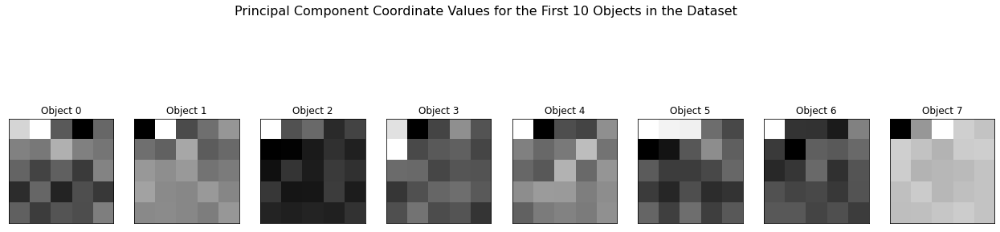

In [145]:
fig, ax = plt.subplots(1, 8, figsize=(22, 6))
fig.suptitle('Principal Component Coordinate Values for the First 10 Objects in the Dataset', fontsize=16)
for i in range(8):
    ax[i].imshow(Y[i].reshape((5, 5)), cmap='gray')
    ax[i].set_xticks([])
    ax[i].set_yticks([])
    ax[i].set_title('Object '+str(i))

plt.show()

These images don't really show us anything useful by themselves.

In [146]:
Y_reduced=pca.inverse_transform(Y)+mean_list
Y_reduced

array([[ 2.53156454e-05,  1.08865324e-04,  2.31308635e-04, ...,
        -3.64523832e-02, -1.95274010e-02, -1.37615106e-03],
       [-7.42755269e-06, -1.98475488e-05, -2.76044076e-04, ...,
        -7.29355354e-03, -2.63228730e-03,  1.78767261e-05],
       [ 6.74722159e-06,  5.04672907e-05,  1.56184207e-04, ...,
        -1.54736249e-02, -4.43617094e-03, -2.59862733e-04],
       ...,
       [-5.05729428e-06, -2.13880811e-07,  1.22613545e-04, ...,
        -7.19922899e-03,  1.51738833e-03,  3.39063126e-04],
       [ 1.89183546e-05,  6.96202859e-05,  2.71241990e-04, ...,
         6.50920516e-02,  2.73913519e-02,  2.79452835e-03],
       [ 7.70358827e-06, -1.05297571e-05, -1.23915097e-05, ...,
         2.72758677e-02,  9.39291336e-03,  7.93133122e-04]])

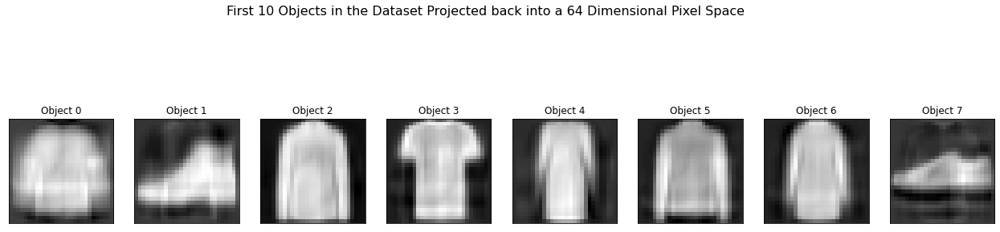

In [147]:
fig, ax = plt.subplots(1, 8, figsize=(22, 6))
fig.suptitle('First 10 Objects in the Dataset Projected back into a 64 Dimensional Pixel Space', fontsize=16)
for i in range(8):
    ax[i].imshow(Y_reduced[i].reshape((28, 28)), cmap='gray')
    ax[i].set_xticks([])
    ax[i].set_yticks([])
    ax[i].set_title('Object '+str(i))

plt.show()

In [148]:
pca.explained_variance_ratio_

array([0.29011353, 0.17727668, 0.060227  , 0.04970272, 0.03839289,
       0.03470997, 0.02344044, 0.01913937, 0.01343605, 0.01310725,
       0.0098979 , 0.0091405 , 0.00765206, 0.00660427, 0.00609188,
       0.00591505, 0.00552045, 0.00530488, 0.00459947, 0.004555  ,
       0.00432815, 0.00406022, 0.00383088, 0.00374172, 0.00361597])

In [149]:
np.sum(pca.explained_variance_ratio_)

0.80440430121592

In [154]:
pca = PCA(n_components=25, random_state=1000)
Y = pca.fit_transform(X)

In [158]:
df_components=pd.DataFrame(Y, columns=['principal_component_'+str(i) for i in range(1,26)])
df_data=pd.DataFrame(X,columns=['pixel_'+str(i) for i in range(0,784)])


df_data=pd.concat([df_data,df_components], axis=1)
df_data['label']=train['label']

df_data

,pixel_0,pixel_1,pixel_2,pixel_3,pixel_4,pixel_5,pixel_6,pixel_7,pixel_8,pixel_9,...,principal_component_17,principal_component_18,principal_component_19,principal_component_20,principal_component_21,principal_component_22,principal_component_23,principal_component_24,principal_component_25,label
0,-0.000004,-0.000024,-0.000139,-0.000400,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,0.338943,-1.658081,-0.385257,-1.007255,0.171667,-0.872961,-0.203561,-0.409747,1.063463,2
1,-0.000004,-0.000024,-0.000139,-0.000400,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,0.074543,-0.022143,0.577323,-0.043187,0.049710,0.106320,-0.023054,-0.339579,0.491939,9
2,-0.000004,-0.000024,-0.000139,-0.000400,-0.000972,-0.001614,-0.00316,0.010987,-0.022282,-0.056819,...,-0.454667,-0.427012,0.848331,-0.208811,0.014344,-0.116285,0.013913,-0.050179,0.508678,6
3,-0.000004,-0.000024,-0.000139,0.003522,0.006871,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,-0.351918,0.193037,0.390938,-0.091947,-0.376299,0.507931,-0.447750,-0.243194,-1.026433,0
4,-0.000004,-0.000024,-0.000139,-0.000400,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,0.923664,0.902532,0.008470,0.476708,-0.929174,-0.104369,0.140566,-0.091752,0.585802,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59995,-0.000004,-0.000024,-0.000139,-0.000400,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,-0.001698,-1.469605,-0.477482,-0.753870,0.042375,-0.077267,-0.003026,0.589545,-0.220541,9
59996,-0.000004,-0.000024,-0.000139,-0.000400,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,-0.569995,0.371930,-0.064411,-0.157889,-0.574326,-0.463286,-0.156127,-0.161427,-0.334950,1
59997,-0.000004,-0.000024,-0.000139,-0.000400,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,-0.215433,0.603861,-0.376100,0.560383,-0.514238,0.293050,0.526421,0.662446,-0.218312,8
59998,-0.000004,-0.000024,-0.000139,-0.000400,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,0.187425,1.609074,-0.004525,-0.837589,0.393630,0.383691,0.495384,0.327395,-0.065579,8


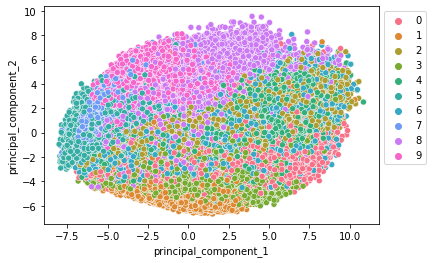

In [159]:
sns.scatterplot(x='principal_component_1', y='principal_component_2', hue='label', palette=sns.color_palette("husl", 10), data=df_data)
plt.legend(bbox_to_anchor=(1,1))
plt.show()

#### 4.2.2. Re-Adding the Pixel Means

Next, add your saved pixel means (from 1.1.2) to each of the loading vectors (**like we did in the lecture**). Then visualize each of these "mean-added" $k$ loading vectors in the 28-by-28 pixel image.

In [71]:
pca.components_[0]

array([ 3.20520499e-07,  2.31668579e-06,  1.81171337e-05,  6.03614443e-05,
        1.33838764e-04,  2.66671956e-04,  4.70827805e-04,  1.29965547e-03,
        3.42466681e-03,  7.73878642e-03,  1.43479923e-02,  2.10081145e-02,
        2.62037313e-02,  2.57602451e-02,  2.53724328e-02,  2.70483072e-02,
        2.51177135e-02,  1.78328972e-02,  1.07955915e-02,  5.04651963e-03,
        1.98180778e-03,  7.63337255e-04,  2.87325292e-04,  1.34554478e-04,
        1.15485758e-04,  6.24497124e-05,  1.09652142e-05,  2.23940407e-07,
        4.34906871e-06,  1.24735817e-05,  5.26189928e-05,  2.75875957e-04,
        5.49401244e-04,  1.51712452e-03,  5.44306996e-03,  1.35285009e-02,
        2.46275866e-02,  3.65318814e-02,  4.62450915e-02,  5.73306151e-02,
        6.17566813e-02,  5.78416419e-02,  5.61727715e-02,  6.06293075e-02,
        6.10607951e-02,  5.16660263e-02,  4.16562073e-02,  3.01295162e-02,
        1.78749837e-02,  7.96139189e-03,  2.48477011e-03,  7.72862925e-04,
        5.38479748e-04,  

In [72]:
mean_centered_eig=pca.components_+mean_list

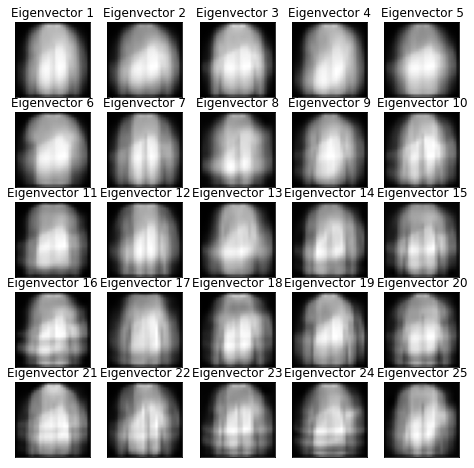

In [73]:
fig, ax = plt.subplots(5, 5, figsize=(8, 8))
for i in range(0,25):
    ax[int(np.floor(i/5)),int(i-5*np.floor(i/5))].set_title('Eigenvector %s'%str(i+1))
    ax[int(np.floor(i/5)),int(i-5*np.floor(i/5))].imshow(mean_centered_eig[i].reshape((28, 28)), cmap='gray')
    ax[int(np.floor(i/5)),int(i-5*np.floor(i/5))].set_xticks([])
    ax[int(np.floor(i/5)),int(i-5*np.floor(i/5))].set_yticks([])
plt.show()

In [74]:
mean_list

array([3.52941176e-06, 2.41176471e-05, 1.38562092e-04, 3.99738562e-04,
       9.72418301e-04, 1.61359477e-03, 3.15986928e-03, 8.62071895e-03,
       2.22823529e-02, 5.68186928e-02, 1.28747386e-01, 1.79337320e-01,
       2.04172876e-01, 1.99225294e-01, 1.97879020e-01, 2.10965556e-01,
       2.01553856e-01, 1.58559739e-01, 1.02287582e-01, 4.08650327e-02,
       1.59990196e-02, 7.60071895e-03, 4.61823529e-03, 3.36464052e-03,
       1.80836601e-03, 9.58039216e-04, 3.63398693e-04, 7.18954248e-05,
       2.50980392e-05, 8.08496732e-05, 3.88104575e-04, 1.40078431e-03,
       3.00869281e-03, 8.25326797e-03, 2.87509150e-02, 6.85188889e-02,
       1.25525556e-01, 2.07116013e-01, 3.11176144e-01, 3.92720327e-01,
       4.43540784e-01, 4.36282484e-01, 4.28074575e-01, 4.50509150e-01,
       4.33559673e-01, 3.56183856e-01, 2.80567908e-01, 1.76600719e-01,
       1.02144183e-01, 5.34702614e-02, 2.43914379e-02, 1.37737908e-02,
       8.66104575e-03, 4.64686275e-03, 1.80026144e-03, 3.28758170e-04,
      

In [75]:
pca.components_

array([[ 3.20520499e-07,  2.31668579e-06,  1.81171337e-05, ...,
         1.11111748e-03,  9.85641062e-05,  1.08814900e-05],
       [-5.16694022e-08,  2.93142370e-06,  7.86142888e-06, ...,
         2.43242483e-03,  7.57989986e-04,  6.57761867e-05],
       [ 4.01780021e-07,  1.92846731e-07,  1.51494164e-05, ...,
        -5.52479996e-04, -1.01539671e-03, -7.41257891e-05],
       ...,
       [-2.58550548e-07,  1.18149672e-06, -5.40474271e-05, ...,
        -2.97238775e-04,  1.81889360e-04,  2.57397208e-04],
       [-3.08443684e-06, -1.41560489e-05, -1.58213171e-05, ...,
         8.47343590e-03,  3.14665877e-03,  1.61834698e-04],
       [ 6.54513750e-07,  6.76911017e-06, -4.14395624e-05, ...,
        -1.25090903e-03, -4.22485070e-04, -1.72404892e-04]])

We can find that magnitude of mean_list and pca-components_ differs a lot. So after adding the mean_list, the pixels of pca.components_ can't change a lot to the sum. Therefo

### 4.3. Analyzing the First Principal Component and Loading Vector

#### 4.3.1. First Two Principal Components in a Scatter Plot
Next, plot your first two principal component attributes in a scatterplot. Color-code the points in your scatterplot by the letter labels.

In [77]:
df_components=pd.DataFrame(Y, columns=['principal_component_'+str(i) for i in range(1,26)])
df_data=pd.DataFrame(X,columns=['pixel_'+str(i) for i in range(0,784)])


df_data=pd.concat([df_data,df_components], axis=1)
df_data['label']=train['label']
df_data

,pixel_0,pixel_1,pixel_2,pixel_3,pixel_4,pixel_5,pixel_6,pixel_7,pixel_8,pixel_9,...,principal_component_17,principal_component_18,principal_component_19,principal_component_20,principal_component_21,principal_component_22,principal_component_23,principal_component_24,principal_component_25,label
0,-0.000004,-0.000024,-0.000139,-0.000400,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,0.338943,-1.658081,-0.385257,-1.007255,0.171667,-0.872961,-0.203561,-0.409747,1.063463,2
1,-0.000004,-0.000024,-0.000139,-0.000400,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,0.074543,-0.022143,0.577323,-0.043187,0.049710,0.106320,-0.023054,-0.339579,0.491939,9
2,-0.000004,-0.000024,-0.000139,-0.000400,-0.000972,-0.001614,-0.00316,0.010987,-0.022282,-0.056819,...,-0.454667,-0.427012,0.848331,-0.208811,0.014344,-0.116285,0.013913,-0.050179,0.508678,6
3,-0.000004,-0.000024,-0.000139,0.003522,0.006871,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,-0.351918,0.193037,0.390938,-0.091947,-0.376299,0.507931,-0.447750,-0.243194,-1.026433,0
4,-0.000004,-0.000024,-0.000139,-0.000400,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,0.923664,0.902532,0.008470,0.476708,-0.929174,-0.104369,0.140566,-0.091752,0.585802,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59995,-0.000004,-0.000024,-0.000139,-0.000400,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,-0.001698,-1.469605,-0.477482,-0.753870,0.042375,-0.077267,-0.003026,0.589545,-0.220541,9
59996,-0.000004,-0.000024,-0.000139,-0.000400,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,-0.569995,0.371930,-0.064411,-0.157889,-0.574326,-0.463286,-0.156127,-0.161427,-0.334950,1
59997,-0.000004,-0.000024,-0.000139,-0.000400,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,-0.215433,0.603861,-0.376100,0.560383,-0.514238,0.293050,0.526421,0.662446,-0.218312,8
59998,-0.000004,-0.000024,-0.000139,-0.000400,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,0.187425,1.609074,-0.004525,-0.837589,0.393630,0.383691,0.495384,0.327395,-0.065579,8


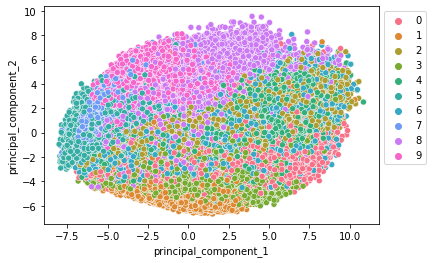

In [79]:
sns.scatterplot(x='principal_component_1', y='principal_component_2', hue='label', palette=sns.color_palette("husl", 10), data=df_data)
plt.legend(bbox_to_anchor=(1,1))
plt.show()

#### 4.3.2. Association between the First Principal Component and the Letters

Create a side-by-side boxplot visualization. Your visualization should have 8 boxplots, one for each letter. The boxplot should plot the principal component 1 values for all images of that corresponding letter.

In [82]:
score_p1 = df_data.groupby(df_data['label'])['principal_component_1', 'label'].apply(lambda x:x[:])
score_p1

principal_component_1  label
label                                    
0     3                   3.227788      0
      10                  7.654293      0
      13                  5.453681      0
      24                  1.184341      0
      31                  4.711531      0
...                            ...    ...
9     59956              -3.812353      9
      59968              -2.286536      9
      59975              -4.406489      9
      59994               0.250197      9
      59995               0.017613      9

[60000 rows x 2 columns]

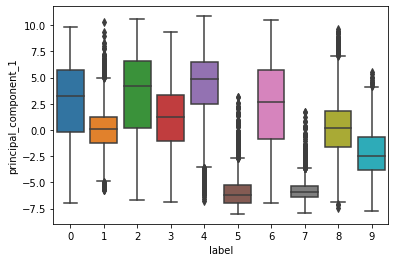

In [83]:
 ax = sns.boxplot(x = score_p1['label'], y=score_p1["principal_component_1"])

#### 4.3.5. Highest Positive Principal Component 1 Values

Visualize the images with the 7 highest positive principal component 1 values.

In [84]:
df_data.sort_values("principal_component_1",ascending=False, inplace=True)
df_data

,pixel_0,pixel_1,pixel_2,pixel_3,pixel_4,pixel_5,pixel_6,pixel_7,pixel_8,pixel_9,...,principal_component_17,principal_component_18,principal_component_19,principal_component_20,principal_component_21,principal_component_22,principal_component_23,principal_component_24,principal_component_25,label
7998,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.003160,-0.008621,0.075757,0.460828,...,0.178207,0.304734,0.187429,-1.017986,-0.246625,0.211205,0.126649,-0.566316,-0.196202,4
27168,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.003160,-0.008621,-0.022282,0.405926,...,-0.481499,-0.147057,-0.587061,-0.311432,-1.185939,1.098381,-0.391665,-0.310324,-0.552847,2
24386,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.003160,-0.008621,0.114973,0.413770,...,0.241809,-1.305115,-0.675359,0.240858,-0.871481,-0.175173,0.407343,-0.202174,0.446673,2
40675,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.003160,-0.008621,0.114973,0.358868,...,0.349596,-0.564874,-1.183959,-0.268728,-0.404876,-0.364283,0.474250,-0.523710,-0.256945,6
15806,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,0.008605,-0.000778,-0.022282,-0.056819,...,-0.780433,-1.121176,0.392338,0.530529,-0.439346,0.290821,-0.207591,0.413635,0.212210,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48154,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.003160,-0.008621,-0.022282,-0.056819,...,0.216647,0.255203,-0.183964,-0.354303,0.814908,0.135706,-0.680713,-0.299065,0.572479,7
52712,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.003160,-0.008621,-0.022282,-0.056819,...,0.087442,-0.516841,-0.125203,-0.335241,0.032218,-0.796559,0.706606,-0.031900,-0.041146,5
3819,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.003160,-0.008621,-0.022282,-0.056819,...,0.194162,-0.517802,0.283251,0.544444,0.201499,-0.228790,-0.214484,-0.659358,-0.107410,5
25716,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.003160,-0.008621,-0.022282,-0.056819,...,0.353668,-0.073909,-0.120683,-0.367963,0.178947,-0.006862,0.050480,-0.434774,0.232600,5


In [86]:
first_7 = df_data[0:7]
first_7.X = first_7.drop(['label'], 1).iloc[:, 0:784]
first_7.X

,pixel_0,pixel_1,pixel_2,pixel_3,pixel_4,pixel_5,pixel_6,pixel_7,pixel_8,pixel_9,...,pixel_774,pixel_775,pixel_776,pixel_777,pixel_778,pixel_779,pixel_780,pixel_781,pixel_782,pixel_783
7998,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.003160,-0.008621,0.075757,0.460828,...,-0.135786,-0.091375,0.605536,0.612277,0.588962,0.341524,-0.033414,-0.010797,-0.003355,-0.000275
27168,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.003160,-0.008621,-0.022282,0.405926,...,-0.135786,-0.091375,-0.065052,-0.007331,0.777197,0.851328,0.495998,-0.010797,-0.003355,-0.000275
24386,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.003160,-0.008621,0.114973,0.413770,...,0.597547,0.716468,0.511419,-0.070076,0.604648,0.800347,0.076390,-0.010797,-0.003355,-0.000275
40675,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.003160,-0.008621,0.114973,0.358868,...,0.319116,0.273331,-0.065052,-0.070076,-0.089470,-0.070241,-0.033414,-0.010797,-0.003355,-0.000275
15806,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,0.008605,-0.000778,-0.022282,-0.056819,...,0.460293,0.449801,0.213379,-0.070076,-0.089470,-0.070241,-0.033414,-0.010797,-0.003355,-0.000275
641,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.003160,-0.008621,0.028698,0.362789,...,0.252449,0.304703,-0.002307,-0.070076,-0.089470,-0.070241,-0.033414,-0.010797,-0.003355,-0.000275
26904,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.003160,-0.008621,0.224776,0.543181,...,0.436763,0.528233,0.182007,-0.070076,-0.089470,-0.070241,-0.033414,-0.010797,-0.003355,-0.000275


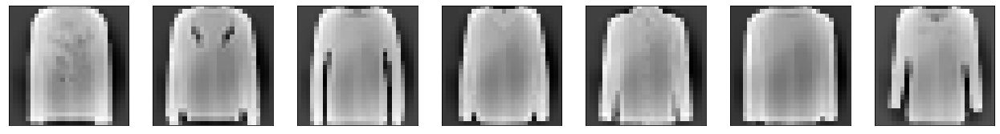

In [87]:
fig, ax = plt.subplots(1, 7, figsize=(22, 6))
for i in range(0,7):
        #First, reshape the flattened 64 pixel array into an 8-by-8 numpy array and unscale the data (ie. multiply by 255)
        object_image = np.array(first_7.X.iloc[i]).reshape((28, 28))*255
        
        #Then show the image
        ax[i].imshow(object_image, cmap='gray')
        ax[i].grid(False)
        ax[i].set_xticks([])
        ax[i].set_yticks([])
plt.show()

#### 4.3.6. Highest Negative Principal Component 1 Values

Visualize the images with the 7 highest negative principal component 1 values.

In [88]:
df_data.sort_values("principal_component_1",ascending=True, inplace=True)
df_data

,pixel_0,pixel_1,pixel_2,pixel_3,pixel_4,pixel_5,pixel_6,pixel_7,pixel_8,pixel_9,...,principal_component_17,principal_component_18,principal_component_19,principal_component_20,principal_component_21,principal_component_22,principal_component_23,principal_component_24,principal_component_25,label
54596,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.003160,-0.008621,-0.022282,-0.056819,...,0.303050,0.134766,0.401080,-0.553510,0.175729,-0.492309,0.636521,-0.190728,-0.166775,5
25716,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.003160,-0.008621,-0.022282,-0.056819,...,0.353668,-0.073909,-0.120683,-0.367963,0.178947,-0.006862,0.050480,-0.434774,0.232600,5
3819,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.003160,-0.008621,-0.022282,-0.056819,...,0.194162,-0.517802,0.283251,0.544444,0.201499,-0.228790,-0.214484,-0.659358,-0.107410,5
52712,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.003160,-0.008621,-0.022282,-0.056819,...,0.087442,-0.516841,-0.125203,-0.335241,0.032218,-0.796559,0.706606,-0.031900,-0.041146,5
48154,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.003160,-0.008621,-0.022282,-0.056819,...,0.216647,0.255203,-0.183964,-0.354303,0.814908,0.135706,-0.680713,-0.299065,0.572479,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15806,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,0.008605,-0.000778,-0.022282,-0.056819,...,-0.780433,-1.121176,0.392338,0.530529,-0.439346,0.290821,-0.207591,0.413635,0.212210,4
40675,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.003160,-0.008621,0.114973,0.358868,...,0.349596,-0.564874,-1.183959,-0.268728,-0.404876,-0.364283,0.474250,-0.523710,-0.256945,6
24386,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.003160,-0.008621,0.114973,0.413770,...,0.241809,-1.305115,-0.675359,0.240858,-0.871481,-0.175173,0.407343,-0.202174,0.446673,2
27168,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.003160,-0.008621,-0.022282,0.405926,...,-0.481499,-0.147057,-0.587061,-0.311432,-1.185939,1.098381,-0.391665,-0.310324,-0.552847,2


In [96]:
first_7 = df_data[0:7]
first_7.X = first_7.drop(['label'], 1).iloc[:, 0:784]
first_7.X

,pixel_0,pixel_1,pixel_2,pixel_3,pixel_4,pixel_5,pixel_6,pixel_7,pixel_8,pixel_9,...,pixel_774,pixel_775,pixel_776,pixel_777,pixel_778,pixel_779,pixel_780,pixel_781,pixel_782,pixel_783
54596,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,-0.135786,-0.091375,-0.065052,-0.070076,-0.08947,-0.070241,-0.033414,-0.010797,-0.003355,-0.000275
25716,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,-0.135786,-0.091375,-0.065052,-0.070076,-0.08947,-0.070241,-0.033414,-0.010797,-0.003355,-0.000275
3819,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,-0.135786,-0.091375,-0.065052,-0.070076,-0.08947,-0.070241,-0.033414,-0.010797,-0.003355,-0.000275
52712,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,-0.135786,-0.091375,-0.065052,-0.070076,-0.08947,-0.070241,-0.033414,-0.010797,-0.003355,-0.000275
48154,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,-0.135786,-0.091375,-0.065052,-0.070076,-0.08947,-0.070241,-0.033414,-0.010797,-0.003355,-0.000275
12869,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,-0.135786,-0.091375,-0.065052,-0.070076,-0.08947,-0.070241,-0.033414,-0.010797,-0.003355,-0.000275
53383,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,-0.135786,-0.091375,-0.065052,-0.070076,-0.08947,-0.070241,-0.033414,-0.010797,-0.003355,-0.000275


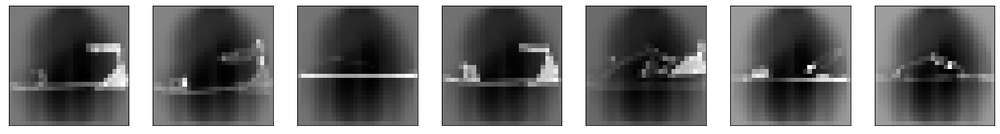

In [95]:
fig, ax = plt.subplots(1, 7, figsize=(22, 6))
for i in range(0,7):
        #First, reshape the flattened 64 pixel array into an 8-by-8 numpy array and unscale the data (ie. multiply by 255)
        object_image = np.array(first_7.X.iloc[i]).reshape((28, 28))*255
        
        #Then show the image
        ax[i].imshow(object_image, cmap='gray')
        ax[i].grid(False)
        ax[i].set_xticks([])
        ax[i].set_yticks([])
plt.show()

Here we can compare the first eigenvector with the plots above. The features of higest and lowest value on PCA1 are pretty different. 

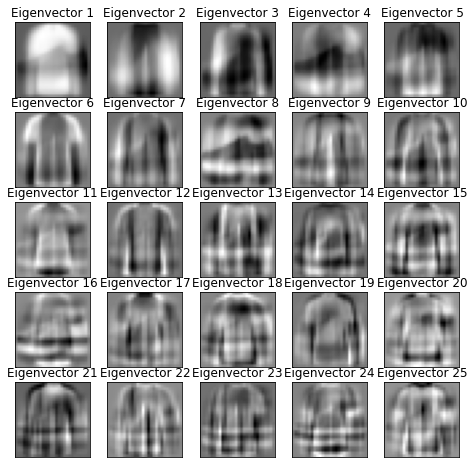

### 4.4. Analyzing the Second Principal Component and Loading Vector

In [106]:
score_p2 = df_data.groupby(df_data['label'])['principal_component_2', 'label'].apply(lambda x:x[:])
score_p2

principal_component_2  label
label                                    
0     5854               -3.189461      0
      34987              -3.687716      0
      625                -2.259773      0
      1393               -3.436921      0
      5302               -3.542913      0
...                            ...    ...
9     7376                1.136754      9
      28622               4.592039      9
      39033               6.151873      9
      22863               4.421215      9
      353                 0.326865      9

[60000 rows x 2 columns]

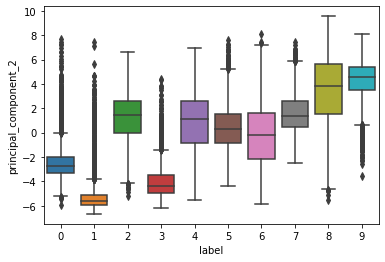

In [107]:
 ax = sns.boxplot(x = score_p2['label'], y=score_p2["principal_component_2"])

In [108]:
df_data.sort_values("principal_component_2",ascending=False, inplace=True)
df_data

,pixel_0,pixel_1,pixel_2,pixel_3,pixel_4,pixel_5,pixel_6,pixel_7,pixel_8,pixel_9,...,principal_component_17,principal_component_18,principal_component_19,principal_component_20,principal_component_21,principal_component_22,principal_component_23,principal_component_24,principal_component_25,label
38412,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,0.341374,-0.450238,0.510475,0.299352,-0.083879,-0.087658,0.699291,0.621690,-1.475088,8
12228,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,0.295182,-0.555756,1.112751,0.646485,0.096936,-0.184770,0.779561,0.528917,-1.206914,8
19224,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,0.960652,-0.025707,-0.096205,1.286404,0.459144,0.040621,-0.168842,0.581944,-1.044279,8
46077,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,0.841078,0.362176,0.038668,0.764847,0.374160,-0.030859,0.311236,0.771040,-0.920843,8
9723,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,0.730674,-1.096919,0.306242,1.776689,0.767502,-0.173278,-0.705378,0.433711,-0.835510,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45041,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,-1.670574,0.230035,0.038354,-0.324665,-0.658647,-1.674289,-0.558448,-0.110869,-0.043942,1
55150,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,-1.548130,-0.112739,0.138441,-0.269313,-0.448849,-1.309066,-0.238081,-0.421452,0.345056,1
35093,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,-1.090476,-0.109284,-0.060288,-0.377596,-0.111559,-0.560608,-0.220199,-0.242253,0.093949,1
42077,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,-1.620870,0.060141,-0.020367,-0.266527,-0.501772,-1.498354,-0.481064,-0.105651,-0.039862,1


In [110]:
first_7 = df_data[0:7]
first_7.X = first_7.drop(['label'], 1).iloc[:, 0:784]
first_7.X

,pixel_0,pixel_1,pixel_2,pixel_3,pixel_4,pixel_5,pixel_6,pixel_7,pixel_8,pixel_9,...,pixel_774,pixel_775,pixel_776,pixel_777,pixel_778,pixel_779,pixel_780,pixel_781,pixel_782,pixel_783
38412,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,-0.135786,-0.091375,-0.065052,-0.070076,-0.08947,-0.070241,-0.033414,-0.010797,-0.003355,-0.000275
12228,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,-0.135786,-0.091375,-0.065052,-0.070076,-0.08947,-0.070241,-0.033414,-0.010797,-0.003355,-0.000275
19224,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,-0.135786,-0.091375,-0.065052,-0.070076,-0.08947,-0.070241,-0.033414,-0.010797,-0.003355,-0.000275
46077,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,-0.135786,-0.091375,-0.065052,-0.070076,-0.08947,-0.070241,-0.033414,-0.010797,-0.003355,-0.000275
9723,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,-0.135786,-0.091375,-0.065052,-0.070076,-0.08947,-0.070241,-0.033414,-0.010797,-0.003355,-0.000275
35548,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,-0.135786,-0.091375,-0.065052,-0.070076,-0.08947,-0.070241,-0.033414,-0.010797,-0.003355,-0.000275
1490,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,-0.135786,-0.091375,-0.065052,-0.070076,-0.08947,-0.070241,-0.033414,-0.010797,-0.003355,-0.000275


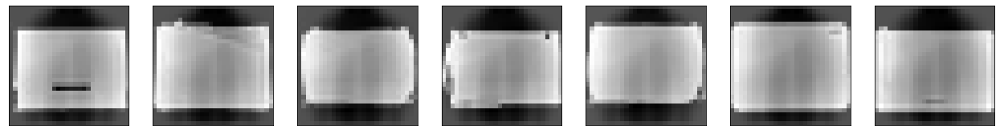

In [111]:
fig, ax = plt.subplots(1, 7, figsize=(22, 6))
for i in range(0,7):
        #First, reshape the flattened 64 pixel array into an 8-by-8 numpy array and unscale the data (ie. multiply by 255)
        object_image = np.array(first_7.X.iloc[i]).reshape((28, 28))*255
        
        #Then show the image
        ax[i].imshow(object_image, cmap='gray')
        ax[i].grid(False)
        ax[i].set_xticks([])
        ax[i].set_yticks([])
plt.show()

In [113]:
df_data.sort_values("principal_component_2",ascending=True, inplace=True)
df_data

,pixel_0,pixel_1,pixel_2,pixel_3,pixel_4,pixel_5,pixel_6,pixel_7,pixel_8,pixel_9,...,principal_component_17,principal_component_18,principal_component_19,principal_component_20,principal_component_21,principal_component_22,principal_component_23,principal_component_24,principal_component_25,label
15330,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,-0.861585,0.456812,0.150322,-0.019970,-0.374136,-0.731231,-0.111348,0.119595,-0.149338,1
42077,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,-1.620870,0.060141,-0.020367,-0.266527,-0.501772,-1.498354,-0.481064,-0.105651,-0.039862,1
35093,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,-1.090476,-0.109284,-0.060288,-0.377596,-0.111559,-0.560608,-0.220199,-0.242253,0.093949,1
55150,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,-1.548130,-0.112739,0.138441,-0.269313,-0.448849,-1.309066,-0.238081,-0.421452,0.345056,1
45041,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,-1.670574,0.230035,0.038354,-0.324665,-0.658647,-1.674289,-0.558448,-0.110869,-0.043942,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9723,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,0.730674,-1.096919,0.306242,1.776689,0.767502,-0.173278,-0.705378,0.433711,-0.835510,8
46077,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,0.841078,0.362176,0.038668,0.764847,0.374160,-0.030859,0.311236,0.771040,-0.920843,8
19224,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,0.960652,-0.025707,-0.096205,1.286404,0.459144,0.040621,-0.168842,0.581944,-1.044279,8
12228,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,0.295182,-0.555756,1.112751,0.646485,0.096936,-0.184770,0.779561,0.528917,-1.206914,8


In [115]:
first_7 = df_data[0:7]
first_7.X = first_7.drop(['label'], 1).iloc[:, 0:784]
first_7.X

,pixel_0,pixel_1,pixel_2,pixel_3,pixel_4,pixel_5,pixel_6,pixel_7,pixel_8,pixel_9,...,pixel_774,pixel_775,pixel_776,pixel_777,pixel_778,pixel_779,pixel_780,pixel_781,pixel_782,pixel_783
15330,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,0.675979,-0.091375,-0.065052,-0.070076,-0.08947,-0.070241,-0.033414,-0.010797,-0.003355,-0.000275
42077,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,-0.124021,-0.091375,-0.065052,-0.070076,-0.08947,-0.070241,-0.033414,-0.010797,-0.003355,-0.000275
35093,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,0.111273,-0.091375,-0.065052,-0.070076,-0.08947,-0.070241,-0.033414,-0.010797,-0.003355,-0.000275
55150,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,-0.135786,-0.091375,-0.065052,-0.070076,-0.08947,-0.070241,-0.033414,-0.010797,-0.003355,-0.000275
45041,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,-0.135786,-0.091375,-0.065052,-0.070076,-0.08947,-0.070241,-0.033414,-0.010797,-0.003355,-0.000275
26759,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,-0.045590,-0.091375,-0.065052,-0.070076,-0.08947,-0.070241,-0.033414,-0.010797,-0.003355,-0.000275
17983,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,-0.135786,-0.091375,-0.065052,-0.070076,-0.08947,-0.070241,-0.033414,-0.010797,-0.003355,-0.000275


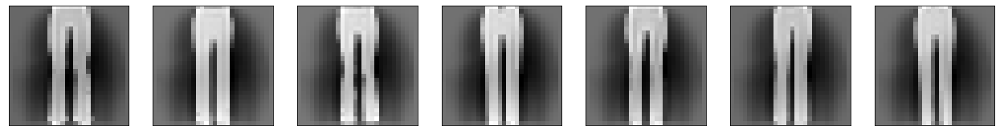

In [116]:
fig, ax = plt.subplots(1, 7, figsize=(22, 6))
for i in range(0,7):
        #First, reshape the flattened 64 pixel array into an 8-by-8 numpy array and unscale the data (ie. multiply by 255)
        object_image = np.array(first_7.X.iloc[i]).reshape((28, 28))*255
        
        #Then show the image
        ax[i].imshow(object_image, cmap='gray')
        ax[i].grid(False)
        ax[i].set_xticks([])
        ax[i].set_yticks([])
plt.show()

The third PCA 

In [117]:
df_data.sort_values("principal_component_3",ascending=False, inplace=True)
df_data

,pixel_0,pixel_1,pixel_2,pixel_3,pixel_4,pixel_5,pixel_6,pixel_7,pixel_8,pixel_9,...,principal_component_17,principal_component_18,principal_component_19,principal_component_20,principal_component_21,principal_component_22,principal_component_23,principal_component_24,principal_component_25,label
18351,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,0.663565,0.442847,1.766794,-0.258592,-0.127209,0.751402,0.339988,0.672019,0.054668,4
16212,-0.000004,-0.000024,-0.000139,-0.0004,0.002949,-0.001614,-0.00316,-0.008621,-0.022282,0.009848,...,0.040272,0.851761,-1.980626,-0.070996,-1.067725,-0.160481,1.118027,-0.744385,-1.378022,2
29991,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.052897,...,0.209545,-2.141863,0.996289,-0.514149,0.458309,-0.193824,-0.391229,-0.185832,0.248538,4
52872,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,1.291645,-1.990328,1.514252,-0.583100,-0.476469,0.135394,-0.504013,0.072973,-0.468151,4
4455,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,0.543016,0.934146,0.186160,0.330487,0.010001,-0.005994,0.820454,-0.320595,0.078398,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15284,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,-0.208370,0.457287,0.549626,0.376366,0.054919,-0.199747,-0.099474,0.632455,0.398622,9
15879,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,-0.501497,0.102225,0.026839,-0.036284,0.048431,0.303534,-0.584694,0.521677,0.181953,9
15878,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,0.101507,1.056960,-0.614371,0.545716,0.700880,0.454306,-0.249217,0.790354,-0.188230,9
59074,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,-0.205405,0.824399,-0.155384,0.392651,0.058218,0.219039,-0.534936,0.693845,0.910897,9


In [118]:
first_7 = df_data[0:7]
first_7.X = first_7.drop(['label'], 1).iloc[:, 0:784]
first_7.X

,pixel_0,pixel_1,pixel_2,pixel_3,pixel_4,pixel_5,pixel_6,pixel_7,pixel_8,pixel_9,...,pixel_774,pixel_775,pixel_776,pixel_777,pixel_778,pixel_779,pixel_780,pixel_781,pixel_782,pixel_783
18351,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,-0.135786,-0.091375,-0.065052,-0.070076,-0.089470,-0.070241,-0.033414,-0.010797,-0.003355,-0.000275
16212,-0.000004,-0.000024,-0.000139,-0.0004,0.002949,-0.001614,-0.00316,-0.008621,-0.022282,0.009848,...,-0.135786,-0.091375,-0.065052,-0.070076,0.216412,0.819955,0.280311,-0.010797,-0.003355,-0.000275
29991,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.052897,...,-0.135786,-0.091375,-0.065052,0.282865,0.577197,0.082700,-0.033414,-0.010797,-0.003355,-0.000275
52872,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,-0.135786,-0.091375,-0.065052,-0.070076,0.145824,0.223877,0.264625,-0.010797,-0.003355,-0.000275
4455,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,-0.127943,-0.091375,0.001615,0.216198,0.079158,0.016033,-0.033414,-0.010797,-0.003355,-0.000275
8711,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,-0.135786,-0.091375,-0.065052,-0.070076,-0.089470,-0.070241,-0.033414,-0.010797,-0.003355,-0.000275
57218,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,-0.135786,-0.091375,-0.065052,-0.070076,0.416412,0.670935,0.346978,-0.010797,-0.003355,-0.000275


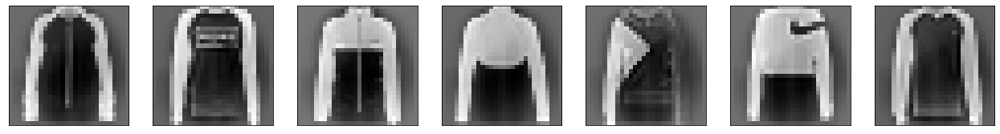

In [119]:
fig, ax = plt.subplots(1, 7, figsize=(22, 6))
for i in range(0,7):
        #First, reshape the flattened 64 pixel array into an 8-by-8 numpy array and unscale the data (ie. multiply by 255)
        object_image = np.array(first_7.X.iloc[i]).reshape((28, 28))*255
        
        #Then show the image
        ax[i].imshow(object_image, cmap='gray')
        ax[i].grid(False)
        ax[i].set_xticks([])
        ax[i].set_yticks([])
plt.show()

In [120]:
df_data.sort_values("principal_component_3",ascending=True, inplace=True)
df_data

,pixel_0,pixel_1,pixel_2,pixel_3,pixel_4,pixel_5,pixel_6,pixel_7,pixel_8,pixel_9,...,principal_component_17,principal_component_18,principal_component_19,principal_component_20,principal_component_21,principal_component_22,principal_component_23,principal_component_24,principal_component_25,label
39033,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,-0.161007,-0.371878,0.505945,-0.486424,0.888263,1.601885,-0.025839,0.024655,-0.915548,9
59074,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,-0.205405,0.824399,-0.155384,0.392651,0.058218,0.219039,-0.534936,0.693845,0.910897,9
15878,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,0.101507,1.056960,-0.614371,0.545716,0.700880,0.454306,-0.249217,0.790354,-0.188230,9
15879,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,-0.501497,0.102225,0.026839,-0.036284,0.048431,0.303534,-0.584694,0.521677,0.181953,9
15284,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,-0.208370,0.457287,0.549626,0.376366,0.054919,-0.199747,-0.099474,0.632455,0.398622,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4455,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,0.543016,0.934146,0.186160,0.330487,0.010001,-0.005994,0.820454,-0.320595,0.078398,2
52872,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,1.291645,-1.990328,1.514252,-0.583100,-0.476469,0.135394,-0.504013,0.072973,-0.468151,4
29991,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.052897,...,0.209545,-2.141863,0.996289,-0.514149,0.458309,-0.193824,-0.391229,-0.185832,0.248538,4
16212,-0.000004,-0.000024,-0.000139,-0.0004,0.002949,-0.001614,-0.00316,-0.008621,-0.022282,0.009848,...,0.040272,0.851761,-1.980626,-0.070996,-1.067725,-0.160481,1.118027,-0.744385,-1.378022,2


In [121]:
first_7 = df_data[0:7]
first_7.X = first_7.drop(['label'], 1).iloc[:, 0:784]
first_7.X

,pixel_0,pixel_1,pixel_2,pixel_3,pixel_4,pixel_5,pixel_6,pixel_7,pixel_8,pixel_9,...,pixel_774,pixel_775,pixel_776,pixel_777,pixel_778,pixel_779,pixel_780,pixel_781,pixel_782,pixel_783
39033,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,-0.135786,-0.091375,-0.065052,-0.070076,-0.08947,-0.070241,-0.033414,-0.010797,-0.003355,-0.000275
59074,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,-0.135786,-0.091375,-0.065052,-0.070076,-0.08947,-0.070241,-0.033414,-0.010797,-0.003355,-0.000275
15878,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,-0.135786,-0.091375,-0.065052,-0.070076,-0.08947,-0.070241,-0.033414,-0.010797,-0.003355,-0.000275
15879,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,-0.135786,-0.091375,-0.065052,-0.070076,-0.08947,-0.070241,-0.033414,-0.010797,-0.003355,-0.000275
15284,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,-0.135786,-0.091375,-0.065052,-0.070076,-0.08947,-0.070241,-0.033414,-0.010797,-0.003355,-0.000275
52152,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,-0.135786,-0.091375,-0.065052,-0.070076,-0.08947,-0.070241,-0.033414,-0.010797,-0.003355,-0.000275
12655,-0.000004,-0.000024,-0.000139,-0.0004,-0.000972,-0.001614,-0.00316,-0.008621,-0.022282,-0.056819,...,-0.135786,-0.091375,-0.065052,-0.070076,-0.08947,-0.070241,-0.033414,-0.010797,-0.003355,-0.000275


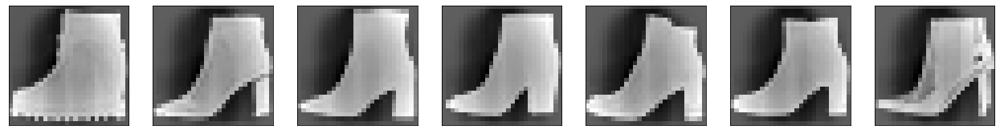

In [122]:
fig, ax = plt.subplots(1, 7, figsize=(22, 6))
for i in range(0,7):
        #First, reshape the flattened 64 pixel array into an 8-by-8 numpy array and unscale the data (ie. multiply by 255)
        object_image = np.array(first_7.X.iloc[i]).reshape((28, 28))*255
        
        #Then show the image
        ax[i].imshow(object_image, cmap='gray')
        ax[i].grid(False)
        ax[i].set_xticks([])
        ax[i].set_yticks([])
plt.show()

In [123]:
train_stand

,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,...,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784,label,predicted_cluster_kmeans
0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,2,3
1,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,9,2
2,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.019608,0.0,0.0,...,0.000000,0.117647,0.168627,0.000000,0.0,0.0,0.0,0.0,6,5
3,0.0,0.0,0.0,0.003922,0.007843,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.000000,0.000000,0.003922,0.0,0.0,0.0,0.0,0,4
4,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,3,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59995,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,9,6
59996,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,1,0
59997,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,...,0.639216,0.529412,0.368627,0.000000,0.0,0.0,0.0,0.0,8,1
59998,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,8,1


## Find subclusters in 10 labels 

In [46]:
from sklearn.cluster import AgglomerativeClustering
from scipy.spatial.distance import pdist
from scipy.cluster.hierarchy import linkage, dendrogram
from sklearn.metrics import silhouette_score

### label 1

In [124]:
label_1 = train_stand[train_stand['label'] == 1]
label_1.drop(['predicted_cluster_kmeans'], 1, inplace = True)
label_1X = label_1.copy()
label_1X.drop(['label'], 1, inplace = True)


In [125]:
label_1X.reset_index(drop = True, inplace=True)
label_1.reset_index(drop = True, inplace=True)

In [126]:
label_1

,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,...,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784,label
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.670588,...,0.003922,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.023529,...,0.803922,0.321569,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.070588,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.098039,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5995,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.517647,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
5996,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
5997,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.094118,0.752941,...,0.098039,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
5998,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.105882,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1


k= 1
k= 2
k= 3
k= 4
k= 5
k= 6
k= 7


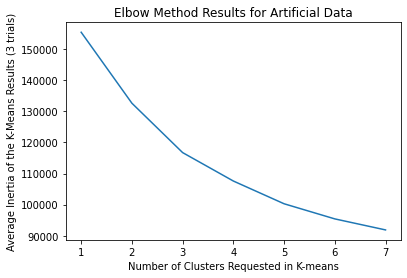

In [17]:
cluster_num_list=range(1,8)
avg_inertia_list=[]
for k in cluster_num_list:
    print('k= '+str(k))
    sub_inertia_list=[]   
    for i in range(0,3):
        kmeans=KMeans(n_clusters=k).fit(label_1X)
        sub_inertia_list.append(kmeans.inertia_)
    avg_inertia_list.append(np.average(sub_inertia_list))

plt.plot(cluster_num_list,avg_inertia_list)
plt.xlabel('Number of Clusters Requested in K-means')
plt.ylabel('Average Inertia of the K-Means Results (3 trials)')
plt.title('Elbow Method Results for Artificial Data')
plt.show()

In [22]:
tsne = TSNE(n_components=2, perplexity=40, random_state=100)
data_tsne = tsne.fit_transform(label_1X)
df_tsne = pd.DataFrame(data_tsne, columns=['x_projected', 'y_projected'])
df_combo = pd.concat([label_1X, df_tsne], axis=1)

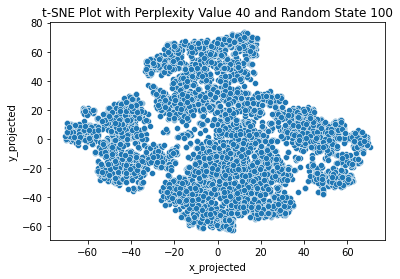

In [23]:
sns.scatterplot(x='x_projected',y='y_projected', data=df_combo)
plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' %(40, 100))
plt.show()

When perplexity value equals to 20, and random state equals to 100, t-SNE plot suggests that there are 3 clusters in dataset of label 1. 

In [127]:
kmeans = KMeans(n_clusters=2, random_state=123)
label_1['predicted_cluster_kmeans'] = kmeans.fit_predict(label_1X)
label_1.head()

,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,...,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784,label,predicted_cluster_kmeans
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.670588,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.023529,...,0.321569,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.070588,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.098039,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1


In [128]:
label_1['sublabel'] = label_1['predicted_cluster_kmeans']
#label_1[label_1['subcluster'] == 1] = '1-1'
label_1 

,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,...,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784,label,predicted_cluster_kmeans,sublabel
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.670588,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1,1
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.023529,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1,1
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.070588,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1,1
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.098039,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5995,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.517647,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1,1
5996,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1,1
5997,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.094118,0.752941,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1,1
5998,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.105882,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0


In [129]:
label_1.loc[(label_1['sublabel'] == 1), 'sublabel'] = '1-1'
label_1.loc[(label_1['sublabel'] == 0), 'sublabel'] = '1-0'
label_1 

,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,...,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784,label,predicted_cluster_kmeans,sublabel
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.670588,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1,1-1
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.023529,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1,1-1
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0,1-0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.070588,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1,1-1
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.098039,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1,1-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5995,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.517647,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1,1-1
5996,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1,1-1
5997,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.094118,0.752941,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1,1-1
5998,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.105882,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0,1-0


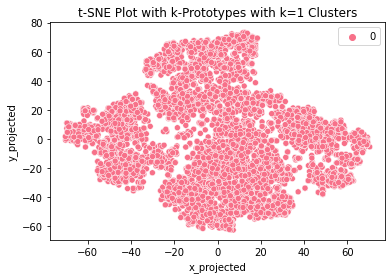

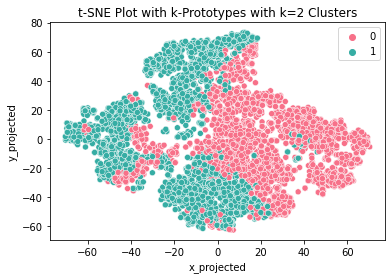

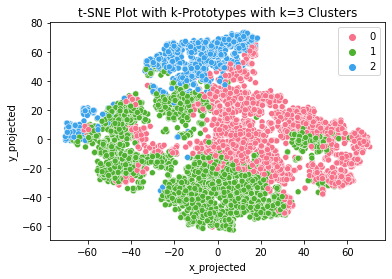

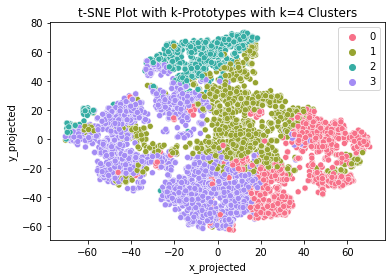

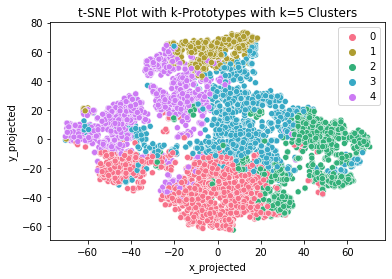

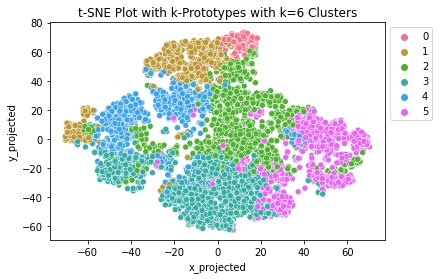

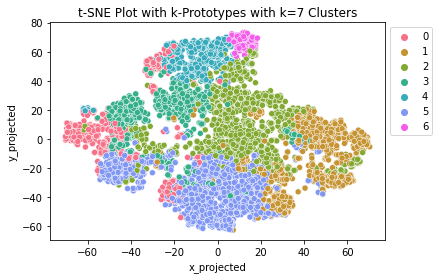

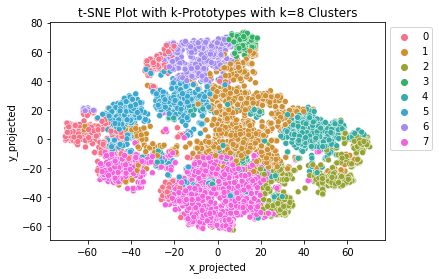

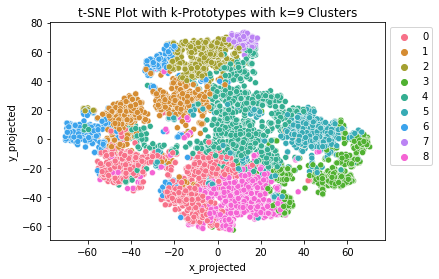

In [25]:
for k in list(range(1,10)):
    kmeans = KMeans(n_clusters=k, random_state=123)
    df_combo['predicted_cluster_kmeans']=kmeans.fit_predict(label_1X)
    sns.scatterplot(x='x_projected',y='y_projected', hue='predicted_cluster_kmeans', palette=sns.color_palette("husl", k), data=df_combo)
    plt.title('t-SNE Plot with k-Prototypes with k=%s Clusters' %(k))
    plt.legend(bbox_to_anchor=(1,1))
    plt.show()
    

In [26]:
kmeans = KMeans(n_clusters=2, random_state=123).fit(label_1X)
#df_centroids=pd.DataFrame(kmeans.cluster_centers_, columns=label_1X.columns)
#df_centroids

In [27]:
df_centroids=pd.DataFrame(kmeans.cluster_centers_, columns = label_1X.columns)
df_centroids

,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,...,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
0,0.0,-1.651714e-20,0.000001,0.000043,0.001154,0.00136,0.003049,0.005546,0.015061,0.089307,...,0.127771,0.025126,0.00889,0.005548,0.003920,0.002717,0.000627,0.000382,0.000116,-3.303428e-20
1,0.0,2.568994e-06,0.000004,0.000009,0.000217,0.00182,0.005458,0.017969,0.051788,0.167909,...,0.364157,0.122681,0.04106,0.016073,0.008866,0.003791,0.001270,0.000437,0.000225,5.137987e-06


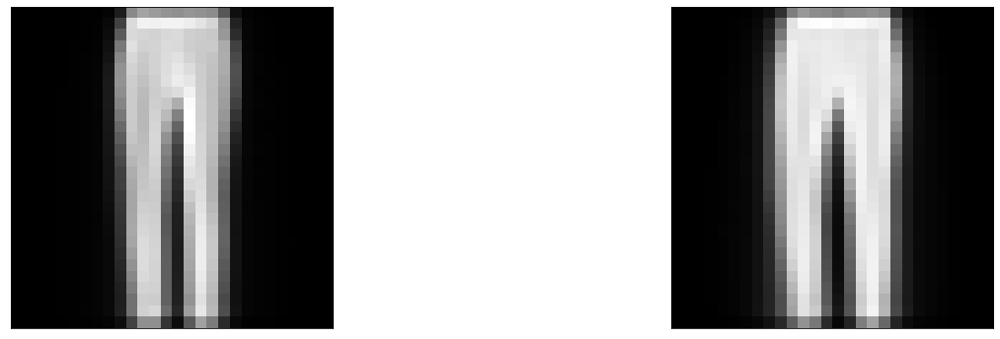

In [29]:
fig, ax = plt.subplots(1, 2, figsize=(22, 6))
for i in range(0,2):
        #First, reshape the flattened 64 pixel array into an 8-by-8 numpy array and unscale the data (ie. multiply by 255)
        object_image = np.array(df_centroids.iloc[i]).reshape((28, 28))*255
        
        #Then show the image
        ax[i].imshow(object_image, cmap='gray')
        ax[i].grid(False)
        ax[i].set_xticks([])
        ax[i].set_yticks([])
plt.show()

### label 8

In [202]:
label_8 = train_stand[train_stand['label'] == 8]
label_8.drop(['predicted_cluster_kmeans'], 1, inplace = True)
label_8X = label_8.copy()
label_8X.drop(['label'], 1, inplace = True)


In [203]:
label_8X.reset_index(drop = True, inplace=True)
label_8.reset_index(drop = True, inplace=True)

k= 1
k= 2
k= 3
k= 4
k= 5
k= 6
k= 7


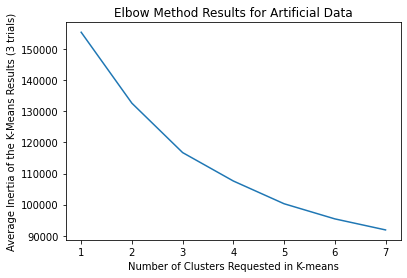

In [33]:
cluster_num_list=range(1,8)
avg_inertia_list=[]
for k in cluster_num_list:
    print('k= '+str(k))
    sub_inertia_list=[]   
    for i in range(0,3):
        kmeans=KMeans(n_clusters=k).fit(label_1X)
        sub_inertia_list.append(kmeans.inertia_)
    avg_inertia_list.append(np.average(sub_inertia_list))

plt.plot(cluster_num_list,avg_inertia_list)
plt.xlabel('Number of Clusters Requested in K-means')
plt.ylabel('Average Inertia of the K-Means Results (3 trials)')
plt.title('Elbow Method Results for Artificial Data')
plt.show()

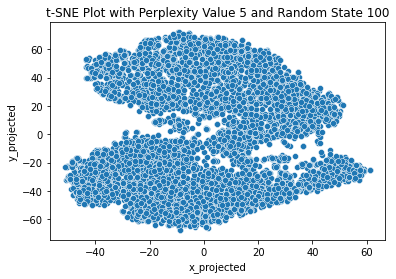

In [34]:
tsne = TSNE(n_components=2, perplexity=40, random_state=100)
data_tsne = tsne.fit_transform(label_8X)
df_tsne = pd.DataFrame(data_tsne, columns=['x_projected', 'y_projected'])
df_combo = pd.concat([label_8X, df_tsne], axis=1)
sns.scatterplot(x='x_projected',y='y_projected', data=df_combo)
plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' %(perp, rs))
plt.show()

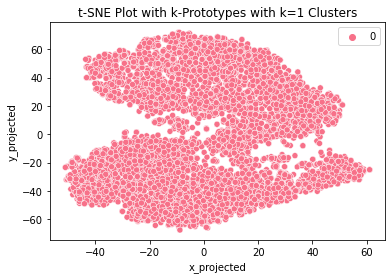

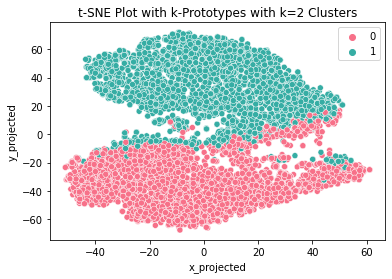

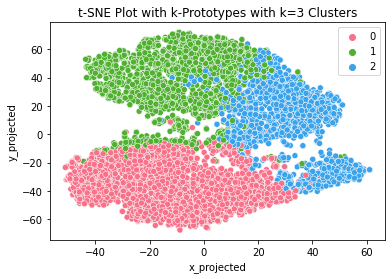

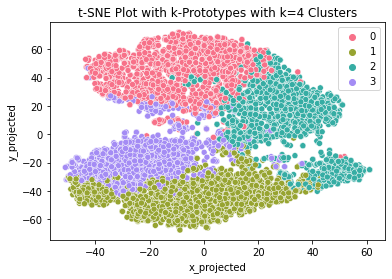

In [35]:
for k in list(range(1,5)):
    kmeans = KMeans(n_clusters=k, random_state=123)
    df_combo['predicted_cluster_kmeans']=kmeans.fit_predict(label_8X)
    sns.scatterplot(x='x_projected',y='y_projected', hue='predicted_cluster_kmeans', palette=sns.color_palette("husl", k), data=df_combo)
    plt.title('t-SNE Plot with k-Prototypes with k=%s Clusters' %(k))
    plt.legend(bbox_to_anchor=(1,1))
    plt.show()
    

In [204]:
kmeans = KMeans(n_clusters=2, random_state=123).fit(label_8X)
df_centroids=pd.DataFrame(kmeans.cluster_centers_, columns = label_8X.columns)
df_centroids

,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,...,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
0,7.783464e-06,0.000013,0.00009,0.001208,0.003339,0.005373,0.006486,0.007743,0.007973,0.008132,...,0.011237,0.010335,0.009917,0.009157,0.009002,0.009104,0.007455,0.005614,0.002428,0.000217
1,-4.235165e-20,0.000111,0.00040,0.000572,0.000585,0.000793,0.001064,0.001668,0.002471,0.004351,...,0.277555,0.266336,0.246084,0.214801,0.165405,0.101589,0.052515,0.028498,0.011497,0.001433


In [205]:
label_8['predicted_cluster_kmeans'] = kmeans.fit_predict(label_8X)
label_8['sublabel'] = label_8['predicted_cluster_kmeans']
label_8.loc[(label_8['sublabel'] == 1), 'sublabel'] = '8-1'
label_8.loc[(label_8['sublabel'] == 0), 'sublabel'] = '8-0'
label_8

,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,...,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784,label,predicted_cluster_kmeans,sublabel
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,8,1,8-1
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.035294,0.031373,0.003922,0.000000,0.000000,0.0,0.0,8,1,8-1
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.145098,0.062745,0.000000,0.000000,0.000000,0.0,0.0,8,1,8-1
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.003922,0.0,0.0,...,0.074510,0.082353,0.160784,0.305882,0.023529,0.0,0.0,8,1,8-1
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,8,1,8-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5995,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,8,0,8-0
5996,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,8,0,8-0
5997,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,8,0,8-0
5998,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.529412,0.368627,0.000000,0.000000,0.000000,0.0,0.0,8,1,8-1


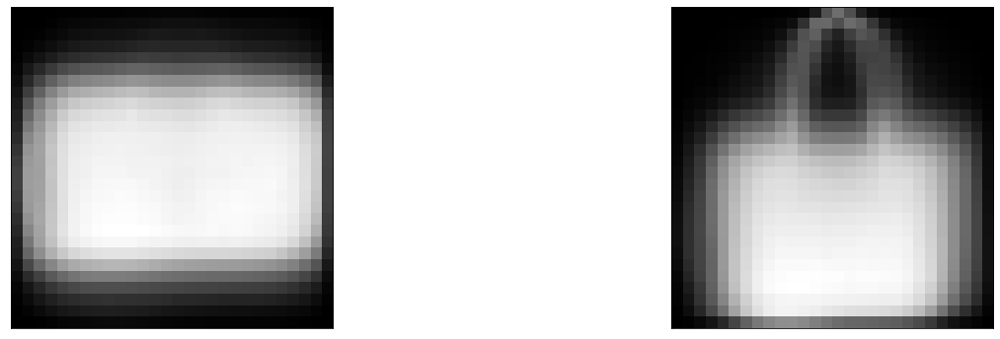

In [37]:
fig, ax = plt.subplots(1, 2, figsize=(22, 6))
for i in range(0,2):
        #First, reshape the flattened 64 pixel array into an 8-by-8 numpy array and unscale the data (ie. multiply by 255)
        object_image = np.array(df_centroids.iloc[i]).reshape((28, 28))*255
        
        #Then show the image
        ax[i].imshow(object_image, cmap='gray')
        ax[i].grid(False)
        ax[i].set_xticks([])
        ax[i].set_yticks([])
plt.show()

### label 3

In [199]:
label_3 = train_stand[train_stand['label'] == 3]
label_3.drop(['predicted_cluster_kmeans'], 1, inplace = True)
label_3X = label_3.copy()
label_3X.drop(['label'], 1, inplace = True)


In [200]:
label_3X.reset_index(drop = True, inplace=True)
label_3.reset_index(drop = True, inplace=True)

k= 1
k= 2
k= 3
k= 4
k= 5
k= 6
k= 7


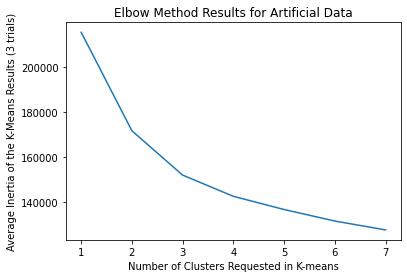

In [40]:
cluster_num_list=range(1,8)
avg_inertia_list=[]
for k in cluster_num_list:
    print('k= '+str(k))
    sub_inertia_list=[]   
    for i in range(0,3):
        kmeans=KMeans(n_clusters=k).fit(label_3X)
        sub_inertia_list.append(kmeans.inertia_)
    avg_inertia_list.append(np.average(sub_inertia_list))

plt.plot(cluster_num_list,avg_inertia_list)
plt.xlabel('Number of Clusters Requested in K-means')
plt.ylabel('Average Inertia of the K-Means Results (3 trials)')
plt.title('Elbow Method Results for Artificial Data')
plt.show()

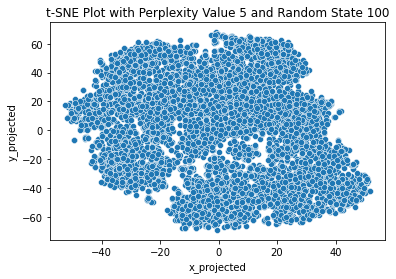

In [41]:
tsne = TSNE(n_components=2, perplexity=40, random_state=100)
data_tsne = tsne.fit_transform(label_3X)
df_tsne = pd.DataFrame(data_tsne, columns=['x_projected', 'y_projected'])
df_combo = pd.concat([label_3X, df_tsne], axis=1)
sns.scatterplot(x='x_projected',y='y_projected', data=df_combo)
plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' %(perp, rs))
plt.show()

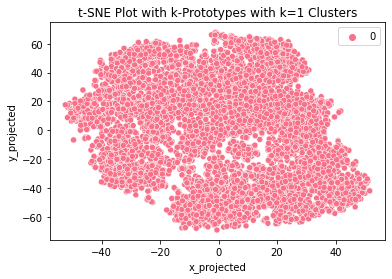

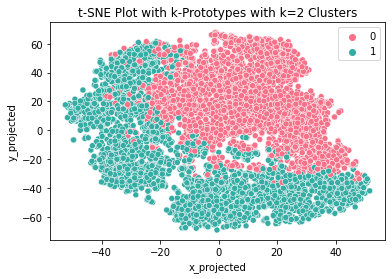

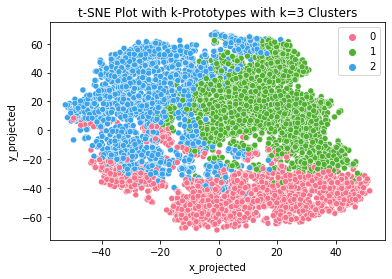

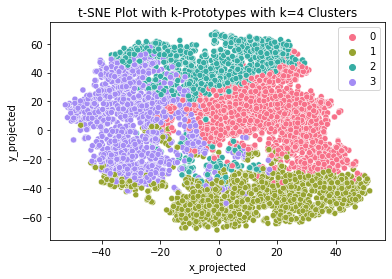

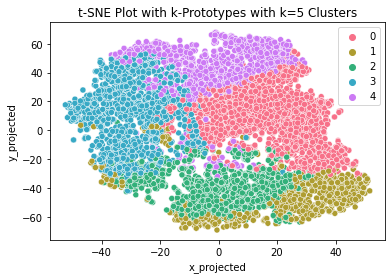

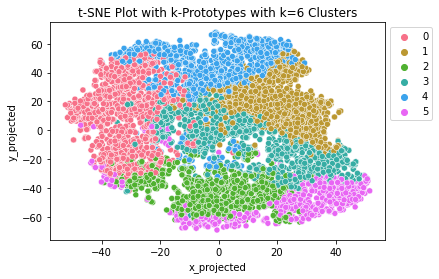

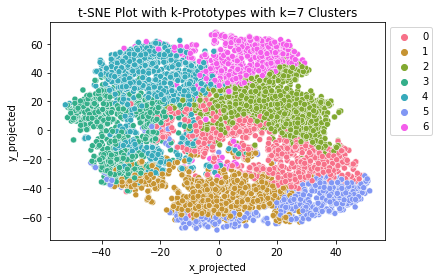

In [42]:
for k in list(range(1,8)):
    kmeans = KMeans(n_clusters=k, random_state=123)
    df_combo['predicted_cluster_kmeans']=kmeans.fit_predict(label_3X)
    sns.scatterplot(x='x_projected',y='y_projected', hue='predicted_cluster_kmeans', palette=sns.color_palette("husl", k), data=df_combo)
    plt.title('t-SNE Plot with k-Prototypes with k=%s Clusters' %(k))
    plt.legend(bbox_to_anchor=(1,1))
    plt.show()
    

In [144]:
kmeans = KMeans(n_clusters=3, random_state=123).fit(label_3X)
df_centroids=pd.DataFrame(kmeans.cluster_centers_, columns = label_3X.columns)
df_centroids

,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,...,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
0,3.517102e-05,3.517102e-05,3.517102e-05,5.935109e-05,0.000396,0.002563,0.005623,0.012877,0.028150,0.114394,...,0.338106,0.191616,0.080671,0.024998,0.008045,0.001868,0.000600,2.967555e-04,9.891849e-05,1.406841e-04
1,-1.084202e-19,-1.084202e-19,1.000911e-05,1.601457e-05,0.001175,0.001906,0.004316,0.007291,0.018044,0.067948,...,0.186596,0.102922,0.045738,0.016317,0.006280,0.002923,0.000462,1.040947e-04,4.003643e-06,8.007287e-06
2,-1.202787e-19,-1.202787e-19,5.251604e-20,-7.453890e-20,0.000017,0.000068,0.001400,0.004564,0.015528,0.076284,...,0.273672,0.135060,0.040114,0.007855,0.001385,0.000341,0.000120,-5.421011e-19,-4.336809e-19,2.168404e-19


In [201]:
label_3['predicted_cluster_kmeans'] = kmeans.fit_predict(label_3X)
label_3['sublabel'] = label_3['predicted_cluster_kmeans']
label_3.loc[(label_3['sublabel'] == 1), 'sublabel'] = '3-1'
label_3.loc[(label_3['sublabel'] == 0), 'sublabel'] = '3-0'
label_3.loc[(label_3['sublabel'] == 2), 'sublabel'] = '3-2'
label_3 

,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,...,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784,label,predicted_cluster_kmeans,sublabel
0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,3,0,3-0
1,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,...,0.000000,0.003922,0.0,0.0,0.0,0.0,0.0,3,0,3-0
2,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.149020,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,3,0,3-0
3,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,3,1,3-1
4,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,3,1,3-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5995,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,3,2,3-2
5996,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,3,2,3-2
5997,0.0,0.0,0.0,0.0,0.0,0.003922,0.0,0.0,0.0,0.000000,...,0.000000,0.003922,0.0,0.0,0.0,0.0,0.0,3,1,3-1
5998,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.086275,...,0.054902,0.000000,0.0,0.0,0.0,0.0,0.0,3,1,3-1


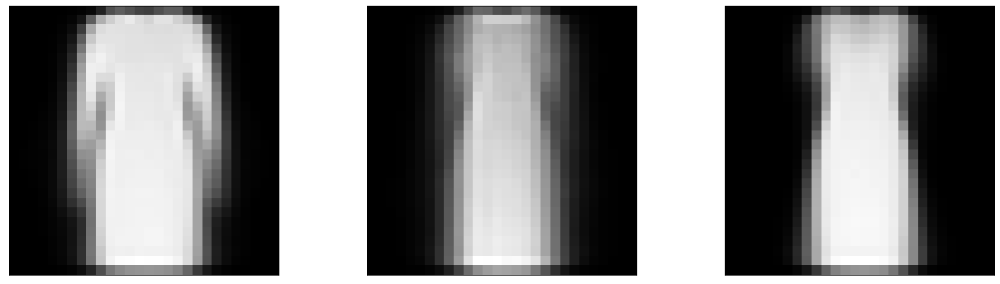

In [44]:
fig, ax = plt.subplots(1, 3, figsize=(22, 6))
for i in range(0,3):
        #First, reshape the flattened 64 pixel array into an 8-by-8 numpy array and unscale the data (ie. multiply by 255)
        object_image = np.array(df_centroids.iloc[i]).reshape((28, 28))*255
        
        #Then show the image
        ax[i].imshow(object_image, cmap='gray')
        ax[i].grid(False)
        ax[i].set_xticks([])
        ax[i].set_yticks([])
plt.show()

### label 5

In [195]:
label_5 = train_stand[train_stand['label'] == 5]
label_5.drop(['predicted_cluster_kmeans'], 1, inplace = True)
label_5X = label_5.copy()
label_5X.drop(['label'], 1, inplace = True)


In [196]:
label_5X.reset_index(drop = True, inplace=True)
label_5.reset_index(drop = True, inplace=True)

k= 1
k= 2
k= 3
k= 4
k= 5
k= 6
k= 7


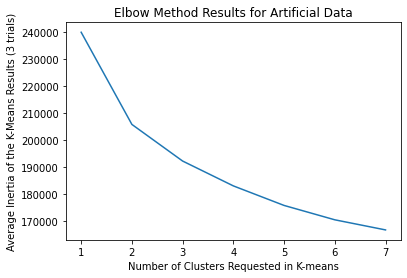

In [47]:
cluster_num_list=range(1,8)
avg_inertia_list=[]
for k in cluster_num_list:
    print('k= '+str(k))
    sub_inertia_list=[]   
    for i in range(0,3):
        kmeans=KMeans(n_clusters=k).fit(label_5X)
        sub_inertia_list.append(kmeans.inertia_)
    avg_inertia_list.append(np.average(sub_inertia_list))

plt.plot(cluster_num_list,avg_inertia_list)
plt.xlabel('Number of Clusters Requested in K-means')
plt.ylabel('Average Inertia of the K-Means Results (3 trials)')
plt.title('Elbow Method Results for Artificial Data')
plt.show()

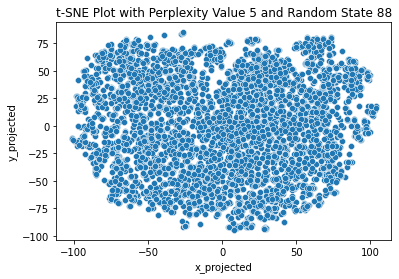

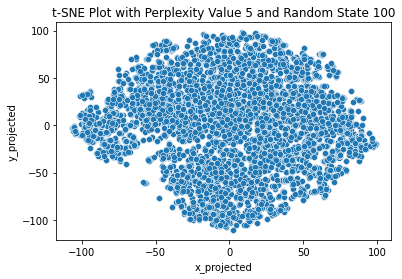

--------------------------------------------


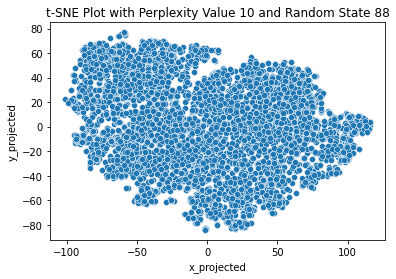

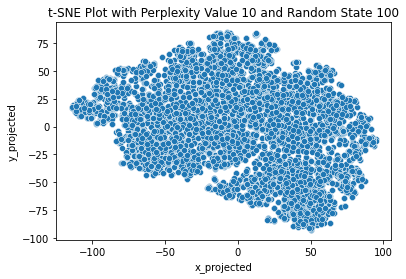

--------------------------------------------


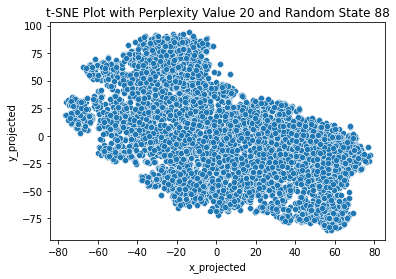

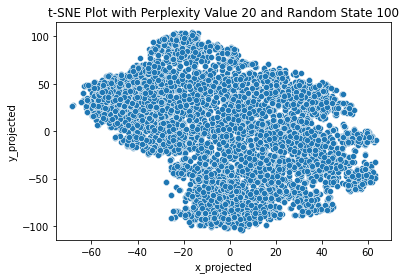

--------------------------------------------


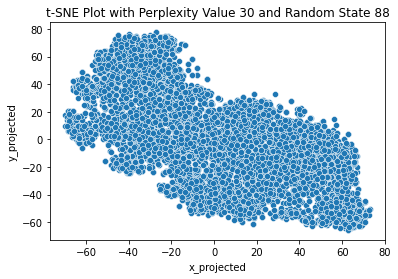

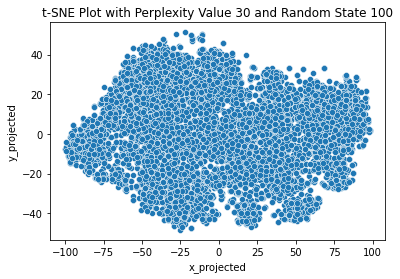

--------------------------------------------


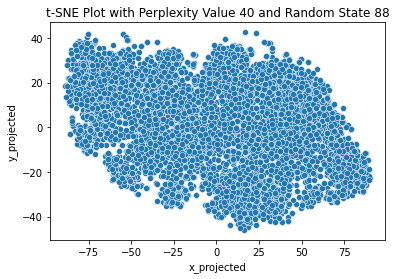

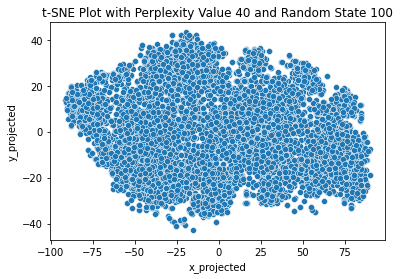

--------------------------------------------


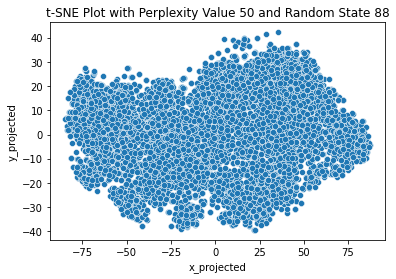

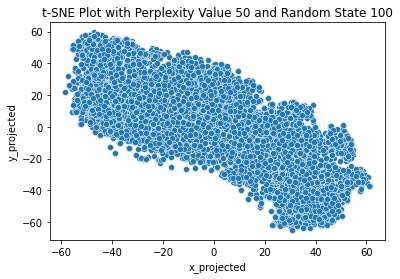

--------------------------------------------


In [48]:
for perp in [5,10, 20, 30, 40, 50]:
    for rs in [88,100]:
        tsne = TSNE(n_components=2, perplexity=perp, random_state=rs)
        data_tsne = tsne.fit_transform(label_5X)
        df_tsne = pd.DataFrame(data_tsne, columns=['x_projected', 'y_projected'])
        df_combo = pd.concat([label_5X, df_tsne], axis=1)
        sns.scatterplot(x='x_projected',y='y_projected', data=df_combo)
        plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' %(perp, rs))
        plt.show()
    print('--------------------------------------------')

In [197]:
kmeans = KMeans(n_clusters=3, random_state=123).fit(label_5X)
df_centroids=pd.DataFrame(kmeans.cluster_centers_, columns = label_3X.columns)
df_centroids

,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,...,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
0,0.0,0.0,0.0,0.0,-9.825582e-20,-9.825582e-20,1.185846e-20,1.355253e-19,3.659182e-19,8.944668e-19,...,-9.974660e-18,-5.637851e-18,-4.336809e-19,7.806256e-18,-6.071532e-17,1.058181e-16,3.642919e-17,-9.887924e-17,-1.301043e-17,9.215718e-19
1,0.0,0.0,0.0,0.0,2.340237e-05,2.340237e-05,2.340237e-05,2.340237e-05,2.340237e-05,2.507397e-05,...,1.492737e-03,1.375725e-03,9.126924e-04,1.353994e-03,1.467663e-03,1.455962e-03,1.695000e-03,2.557545e-03,1.531184e-03,2.056065e-04
2,0.0,0.0,0.0,0.0,4.057495e-06,4.057495e-06,8.114989e-06,2.840246e-05,2.941684e-04,4.950144e-04,...,2.625199e-03,3.132386e-03,6.778045e-03,1.686498e-02,2.958319e-02,3.257762e-02,3.957883e-02,4.188755e-02,1.805179e-02,4.057495e-04


In [198]:
label_5['predicted_cluster_kmeans'] = kmeans.fit_predict(label_5X)
label_5['sublabel'] = label_5['predicted_cluster_kmeans']
label_5.loc[(label_5['sublabel'] == 1), 'sublabel'] = '5-1'
label_5.loc[(label_5['sublabel'] == 0), 'sublabel'] = '5-0'
label_5.loc[(label_5['sublabel'] == 2), 'sublabel'] = '5-2'
label_5

,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,...,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784,label,predicted_cluster_kmeans,sublabel
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5,1,5-1
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5,2,5-2
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5,0,5-0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5,0,5-0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5,0,5-0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5995,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5,0,5-0
5996,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5,0,5-0
5997,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5,0,5-0
5998,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5,2,5-2


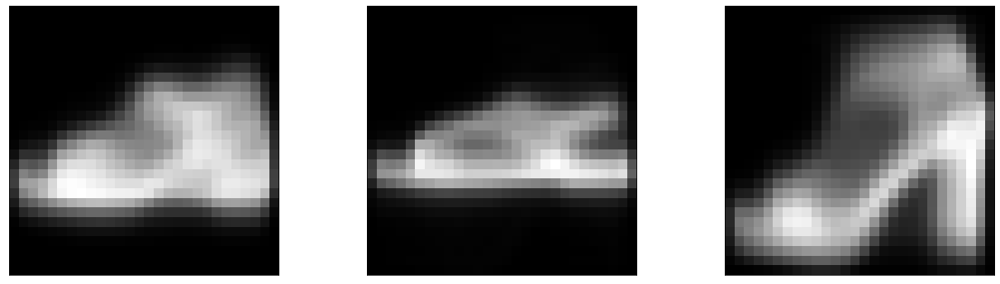

In [50]:
fig, ax = plt.subplots(1, 3, figsize=(22, 6))
for i in range(0,3):
        #First, reshape the flattened 64 pixel array into an 8-by-8 numpy array and unscale the data (ie. multiply by 255)
        object_image = np.array(df_centroids.iloc[i]).reshape((28, 28))*255
        
        #Then show the image
        ax[i].imshow(object_image, cmap='gray')
        ax[i].grid(False)
        ax[i].set_xticks([])
        ax[i].set_yticks([])
plt.show()

### label 0

In [188]:
label_0 = train_stand[train_stand['label'] == 0]
label_0.drop(['predicted_cluster_kmeans'], 1, inplace = True)
label_0X = label_0.copy()
label_0X.drop(['label'], 1, inplace = True)


In [189]:
label_0X.reset_index(drop = True, inplace=True)
label_0.reset_index(drop = True, inplace=True)

k= 1
k= 2
k= 3
k= 4
k= 5
k= 6
k= 7


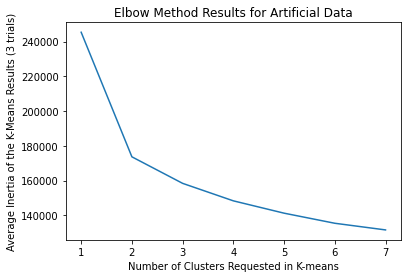

In [53]:
cluster_num_list=range(1,8)
avg_inertia_list=[]
for k in cluster_num_list:
    print('k= '+str(k))
    sub_inertia_list=[]   
    for i in range(0,3):
        kmeans=KMeans(n_clusters=k).fit(label_0X)
        sub_inertia_list.append(kmeans.inertia_)
    avg_inertia_list.append(np.average(sub_inertia_list))

plt.plot(cluster_num_list,avg_inertia_list)
plt.xlabel('Number of Clusters Requested in K-means')
plt.ylabel('Average Inertia of the K-Means Results (3 trials)')
plt.title('Elbow Method Results for Artificial Data')
plt.show()

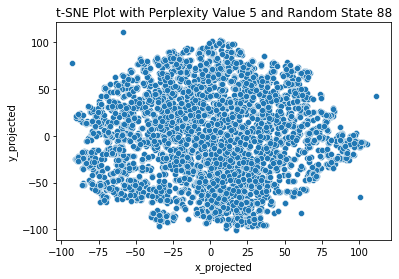

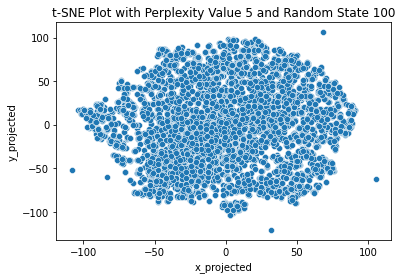

--------------------------------------------


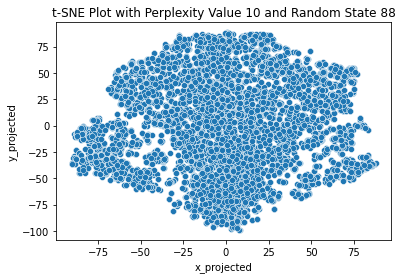

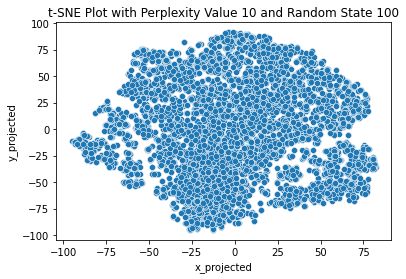

--------------------------------------------


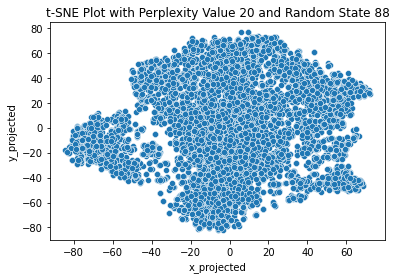

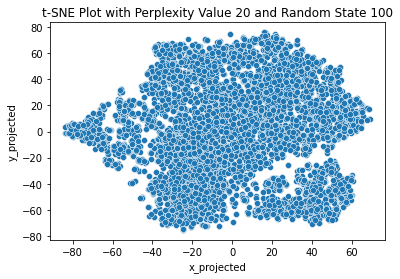

--------------------------------------------


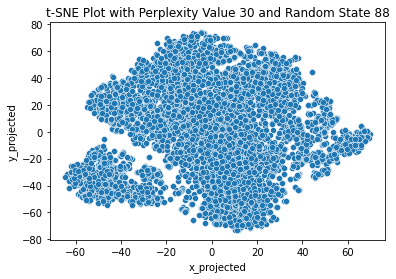

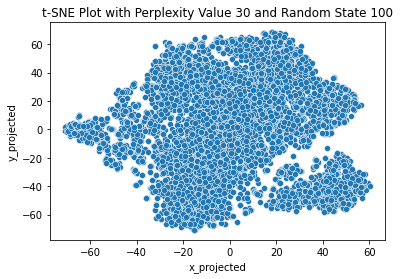

--------------------------------------------


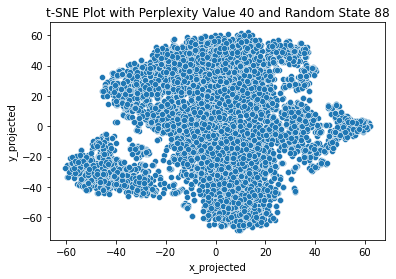

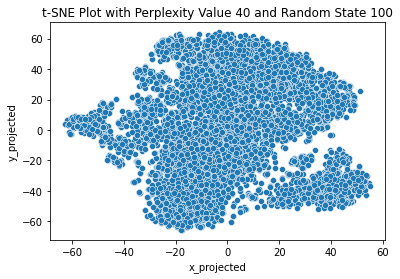

--------------------------------------------


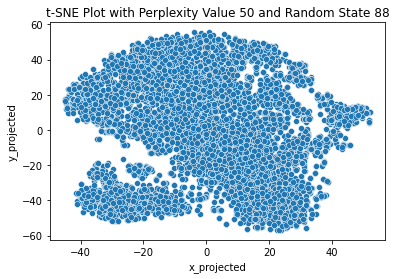

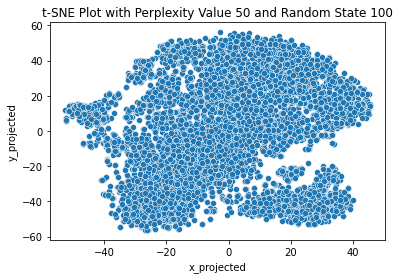

--------------------------------------------


In [54]:
for perp in [5,10, 20, 30, 40, 50]:
    for rs in [88,100]:
        tsne = TSNE(n_components=2, perplexity=perp, random_state=rs)
        data_tsne = tsne.fit_transform(label_0X)
        df_tsne = pd.DataFrame(data_tsne, columns=['x_projected', 'y_projected'])
        df_combo = pd.concat([label_0X, df_tsne], axis=1)
        sns.scatterplot(x='x_projected',y='y_projected', data=df_combo)
        plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' %(perp, rs))
        plt.show()
    print('--------------------------------------------')

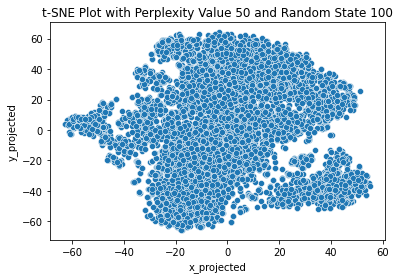

In [55]:
tsne = TSNE(n_components=2, perplexity=40, random_state=100)
data_tsne = tsne.fit_transform(label_0X)
df_tsne = pd.DataFrame(data_tsne, columns=['x_projected', 'y_projected'])
df_combo = pd.concat([label_0X, df_tsne], axis=1)
sns.scatterplot(x='x_projected',y='y_projected', data=df_combo)
plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' %(perp, rs))
plt.show()

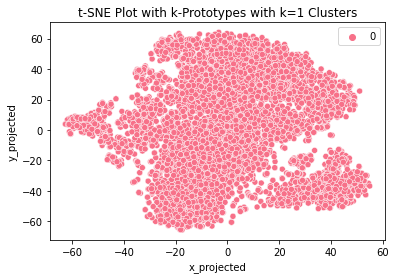

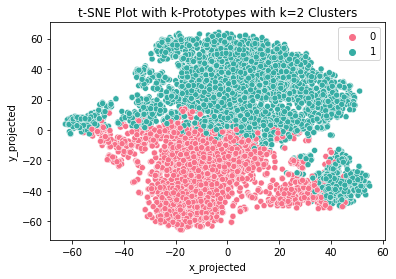

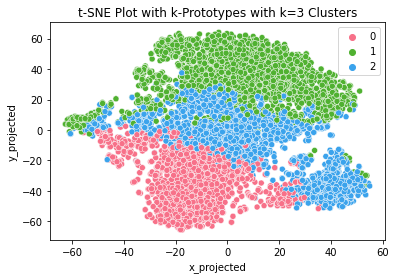

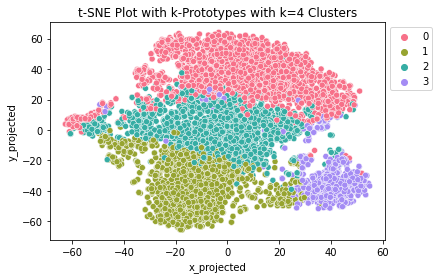

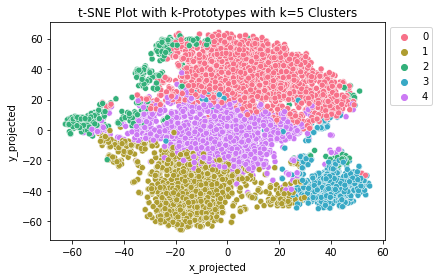

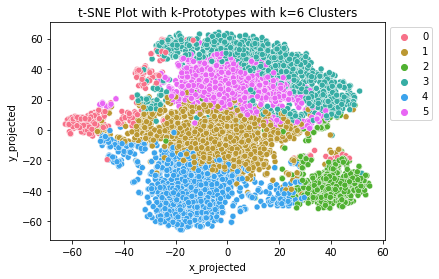

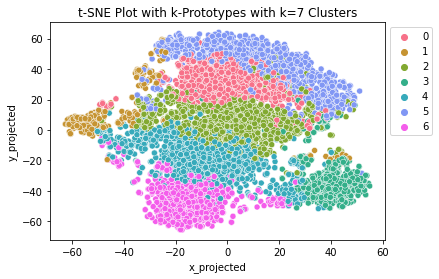

In [56]:
for k in list(range(1,8)):
    kmeans = KMeans(n_clusters=k, random_state=123).fit(label_0X)
    df_combo['predicted_cluster_kmeans']=kmeans.fit_predict(label_0X)
    sns.scatterplot(x='x_projected',y='y_projected', hue='predicted_cluster_kmeans', palette=sns.color_palette("husl", k), data=df_combo)
    plt.title('t-SNE Plot with k-Prototypes with k=%s Clusters' %(k))
    plt.legend(bbox_to_anchor=(1,1))
    plt.show()
    

In [153]:
kmeans = KMeans(n_clusters=2, random_state=123).fit(label_0X)
df_centroids=pd.DataFrame(kmeans.cluster_centers_, columns = label_0X.columns)
df_centroids

,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,...,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
0,-6.268044e-20,0.000044,0.000400,0.001084,0.001582,0.002468,0.007331,0.023229,0.058633,0.119894,...,0.230418,0.196599,0.155728,0.068627,0.020504,0.007263,0.003110,0.001549,0.000626,0.000098
1,8.743743e-06,0.000074,0.000674,0.001453,0.001923,0.003102,0.005808,0.020035,0.061077,0.136307,...,0.439162,0.391920,0.308421,0.128028,0.029546,0.007367,0.002916,0.001063,0.000378,0.000201


In [190]:
label_0['predicted_cluster_kmeans'] = kmeans.fit_predict(label_0X)
label_0['sublabel'] = label_0['predicted_cluster_kmeans']
label_0.loc[(label_0['sublabel'] == 1), 'sublabel'] = '0-1'
label_0.loc[(label_0['sublabel'] == 0), 'sublabel'] = '0-0'
label_0

,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,...,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784,label,predicted_cluster_kmeans,sublabel
0,0.0,0.0,0.0,0.003922,0.007843,0.0,0.0,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.003922,0.000000,0.0,0.0,0.0,0,1,0-1
1,0.0,0.0,0.0,0.000000,0.003922,0.0,0.0,0.000000,0.000000,0.160784,...,0.000000,0.000000,0.003922,0.000000,0.0,0.0,0.0,0,1,0-1
2,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.003922,0.0,0.0,0.0,0,1,0-1
3,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.156863,0.478431,...,0.192157,0.000000,0.000000,0.000000,0.0,0.0,0.0,0,0,0-0
4,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.007843,...,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0,1,0-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5995,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.160784,0.556863,...,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0,1,0-1
5996,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.003922,0.000000,...,0.000000,0.000000,0.011765,0.000000,0.0,0.0,0.0,0,1,0-1
5997,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.007843,0.000000,0.000000,...,0.000000,0.003922,0.000000,0.000000,0.0,0.0,0.0,0,1,0-1
5998,0.0,0.0,0.0,0.007843,0.000000,0.0,0.0,0.000000,0.000000,0.011765,...,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0,0,0-0


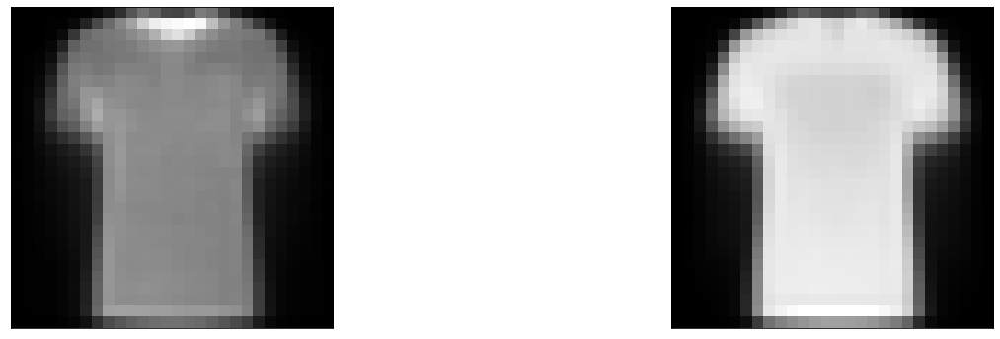

In [58]:
fig, ax = plt.subplots(1, 2, figsize=(22, 6))
for i in range(0,2):
        #First, reshape the flattened 64 pixel array into an 8-by-8 numpy array and unscale the data (ie. multiply by 255)
        object_image = np.array(df_centroids.iloc[i]).reshape((28, 28))*255
        
        #Then show the image
        ax[i].imshow(object_image, cmap='gray')
        ax[i].grid(False)
        ax[i].set_xticks([])
        ax[i].set_yticks([])
plt.show()

In [59]:
df_combo

,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,...,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784,x_projected,y_projected,predicted_cluster_kmeans
0,0.0,0.0,0.0,0.003922,0.007843,0.0,0.0,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.003922,0.000000,0.0,0.0,0.0,-3.864240,4.897284,2
1,0.0,0.0,0.0,0.000000,0.003922,0.0,0.0,0.000000,0.000000,0.160784,...,0.000000,0.000000,0.003922,0.000000,0.0,0.0,0.0,29.826345,45.178852,5
2,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.003922,0.0,0.0,0.0,-37.393990,7.757418,1
3,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.156863,0.478431,...,0.192157,0.000000,0.000000,0.000000,0.0,0.0,0.0,33.692158,-36.432476,3
4,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.007843,...,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,14.003662,6.852467,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5995,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.160784,0.556863,...,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,45.337769,-36.249870,3
5996,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.003922,0.000000,...,0.000000,0.000000,0.011765,0.000000,0.0,0.0,0.0,-3.136729,23.217613,0
5997,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.007843,0.000000,0.000000,...,0.000000,0.003922,0.000000,0.000000,0.0,0.0,0.0,0.434934,30.412807,0
5998,0.0,0.0,0.0,0.007843,0.000000,0.0,0.0,0.000000,0.000000,0.011765,...,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,-12.601389,-1.265504,4


### label 2

In [191]:
label_2 = train_stand[train_stand['label'] == 2]
label_2.drop(['predicted_cluster_kmeans'], 1, inplace = True)
label_2X = label_2.copy()
label_2X.drop(['label'], 1, inplace = True)


In [192]:
label_2X.reset_index(drop = True, inplace=True)
label_2.reset_index(drop = True, inplace=True)

k= 1
k= 2
k= 3
k= 4
k= 5
k= 6
k= 7


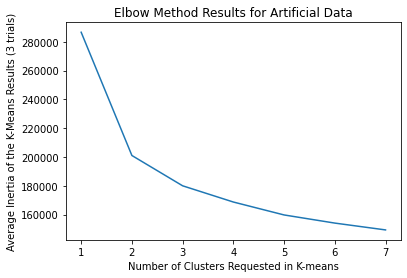

In [62]:
cluster_num_list=range(1,8)
avg_inertia_list=[]
for k in cluster_num_list:
    print('k= '+str(k))
    sub_inertia_list=[]   
    for i in range(0,3):
        kmeans=KMeans(n_clusters=k).fit(label_2X)
        sub_inertia_list.append(kmeans.inertia_)
    avg_inertia_list.append(np.average(sub_inertia_list))

plt.plot(cluster_num_list,avg_inertia_list)
plt.xlabel('Number of Clusters Requested in K-means')
plt.ylabel('Average Inertia of the K-Means Results (3 trials)')
plt.title('Elbow Method Results for Artificial Data')
plt.show()

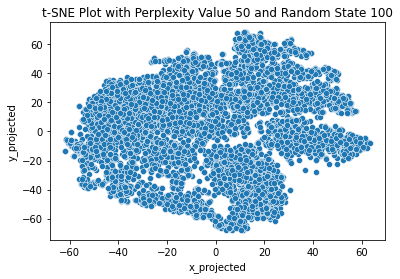

In [63]:
tsne = TSNE(n_components=2, perplexity=40, random_state=100)
data_tsne = tsne.fit_transform(label_2X)
df_tsne = pd.DataFrame(data_tsne, columns=['x_projected', 'y_projected'])
df_combo = pd.concat([label_2X, df_tsne], axis=1)
sns.scatterplot(x='x_projected',y='y_projected', data=df_combo)
plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' %(perp, rs))
plt.show()

In [193]:
kmeans = KMeans(n_clusters=2, random_state=123).fit(label_2X)
df_centroids=pd.DataFrame(kmeans.cluster_centers_, columns = label_2X.columns)
df_centroids

,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,...,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
0,0.0,0.000045,0.000160,0.000376,0.001022,0.001737,0.005160,0.019161,0.048505,0.108201,...,0.060913,0.053409,0.066949,0.175169,0.263542,0.194764,0.085152,0.021161,0.004681,0.000645
1,0.0,0.000010,0.000153,0.000440,0.001119,0.001884,0.003299,0.011373,0.041374,0.116065,...,0.083899,0.075306,0.064489,0.178750,0.363553,0.326584,0.150392,0.035377,0.004562,0.000175


In [194]:
label_2['predicted_cluster_kmeans'] = kmeans.fit_predict(label_2X)
label_2['sublabel'] = label_2['predicted_cluster_kmeans']
label_2.loc[(label_2['sublabel'] == 1), 'sublabel'] = '2-1'
label_2.loc[(label_2['sublabel'] == 0), 'sublabel'] = '2-0'
label_2

,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,...,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784,label,predicted_cluster_kmeans,sublabel
0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,2,0,2-0
1,0.0,0.0,0.0,0.0,0.003922,0.003922,0.000000,0.000000,0.000000,0.000000,...,0.745098,0.635294,0.321569,0.000000,0.0,0.0,0.0,2,1,2-1
2,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.062745,0.168627,...,0.003922,0.003922,0.003922,0.000000,0.0,0.0,0.0,2,1,2-1
3,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,2,0,2-0
4,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,2,0,2-0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5995,0.0,0.0,0.0,0.0,0.000000,0.000000,0.003922,0.003922,0.000000,0.000000,...,0.152941,0.447059,0.215686,0.000000,0.0,0.0,0.0,2,1,2-1
5996,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.039216,...,0.000000,0.254902,0.050980,0.027451,0.0,0.0,0.0,2,1,2-1
5997,0.0,0.0,0.0,0.0,0.000000,0.003922,0.000000,0.000000,0.086275,0.254902,...,0.000000,0.521569,0.501961,0.192157,0.0,0.0,0.0,2,1,2-1
5998,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,2,1,2-1


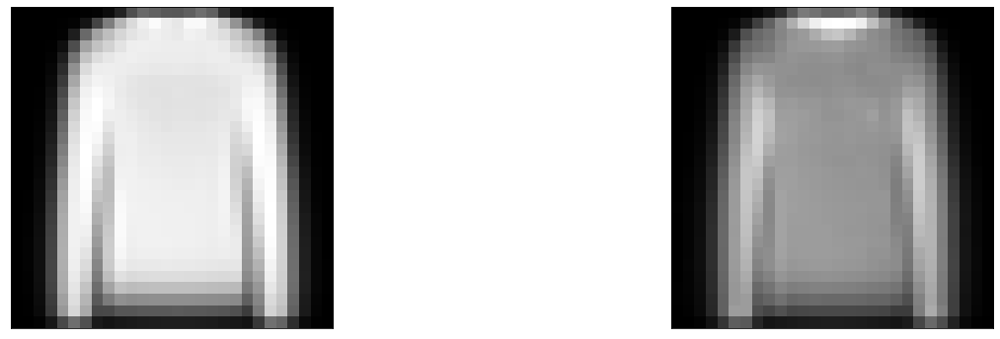

In [65]:
fig, ax = plt.subplots(1, 2, figsize=(22, 6))
for i in range(0,2):
        #First, reshape the flattened 64 pixel array into an 8-by-8 numpy array and unscale the data (ie. multiply by 255)
        object_image = np.array(df_centroids.iloc[i]).reshape((28, 28))*255
        
        #Then show the image
        ax[i].imshow(object_image, cmap='gray')
        ax[i].grid(False)
        ax[i].set_xticks([])
        ax[i].set_yticks([])
plt.show()

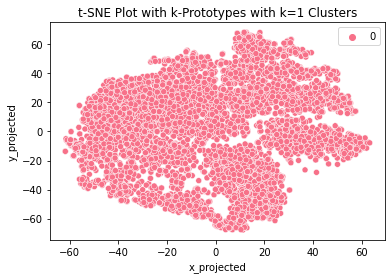

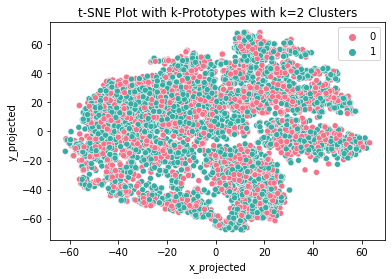

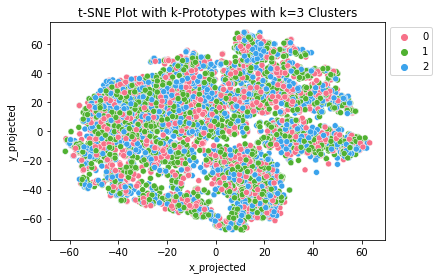

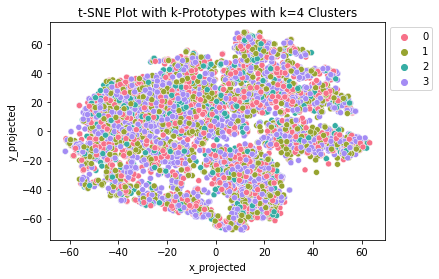

In [66]:
for k in list(range(1,5)):
    kmeans = KMeans(n_clusters=k, random_state=123).fit(label_0X)
    df_combo['predicted_cluster_kmeans']=kmeans.fit_predict(label_0X)
    sns.scatterplot(x='x_projected',y='y_projected', hue='predicted_cluster_kmeans', palette=sns.color_palette("husl", k), data=df_combo)
    plt.title('t-SNE Plot with k-Prototypes with k=%s Clusters' %(k))
    plt.legend(bbox_to_anchor=(1,1))
    plt.show()
    

### label 6

In [182]:
label_6 = train_stand[train_stand['label'] == 6]
label_6.drop(['predicted_cluster_kmeans'], 1, inplace = True)
label_6X = label_6.copy()
label_6X.drop(['label'], 1, inplace = True)


In [183]:
label_6X.reset_index(drop = True, inplace=True)
label_6.reset_index(drop = True, inplace=True)
label_6X


,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,...,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.019608,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.117647,0.168627,0.000000,0.000000,0.000000,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.007843,...,0.160784,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.015686,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,...,0.000000,0.003922,0.000000,0.000000,0.541176,0.603922,0.305882,0.000000,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.003922,0.003922,...,0.317647,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5995,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,...,0.133333,0.070588,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
5996,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.066667,0.694118,...,0.611765,0.403922,0.113725,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
5997,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.313725,...,0.000000,0.000000,0.000000,0.000000,0.003922,0.000000,0.000000,0.000000,0.0,0.0
5998,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0


k= 1
k= 2
k= 3
k= 4
k= 5
k= 6
k= 7


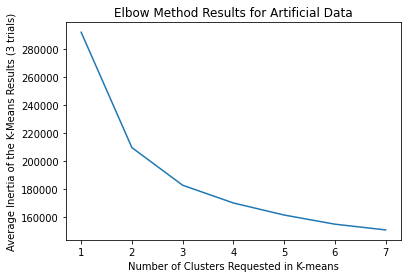

In [69]:
cluster_num_list=range(1,8)
avg_inertia_list=[]
for k in cluster_num_list:
    print('k= '+str(k))
    sub_inertia_list=[]   
    for i in range(0,3):
        kmeans=KMeans(n_clusters=k).fit(label_6X)
        sub_inertia_list.append(kmeans.inertia_)
    avg_inertia_list.append(np.average(sub_inertia_list))

plt.plot(cluster_num_list,avg_inertia_list)
plt.xlabel('Number of Clusters Requested in K-means')
plt.ylabel('Average Inertia of the K-Means Results (3 trials)')
plt.title('Elbow Method Results for Artificial Data')
plt.show()

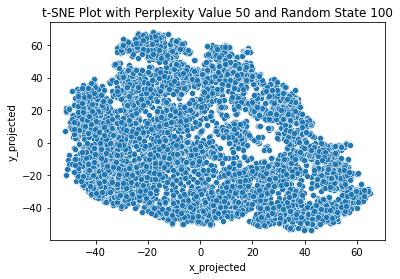

In [70]:
tsne = TSNE(n_components=2, perplexity=40, random_state=100)
data_tsne = tsne.fit_transform(label_6X)
df_tsne = pd.DataFrame(data_tsne, columns=['x_projected', 'y_projected'])
df_combo = pd.concat([label_6X, df_tsne], axis=1)
sns.scatterplot(x='x_projected',y='y_projected', data=df_combo)
plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' %(perp, rs))
plt.show()

In [184]:
kmeans = KMeans(n_clusters=2, random_state=123).fit(label_6X)
df_centroids=pd.DataFrame(kmeans.cluster_centers_, columns = label_6X.columns)
df_centroids

,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,...,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
0,0.000021,0.000036,0.000401,0.001346,0.003866,0.004825,0.008614,0.021336,0.045706,0.074478,...,0.128971,0.083577,0.056244,0.070594,0.099656,0.065472,0.032676,0.006983,0.001648,0.000183
1,0.000006,0.000043,0.000279,0.001084,0.002570,0.004612,0.008015,0.025004,0.060344,0.099058,...,0.190493,0.129849,0.091813,0.107350,0.161618,0.133780,0.062562,0.013087,0.002671,0.000306


In [185]:
label_6['predicted_cluster_kmeans'] = kmeans.fit_predict(label_6X)
label_6['sublabel'] = label_6['predicted_cluster_kmeans']
label_6.loc[(label_6['sublabel'] == 1), 'sublabel'] = '6-1'
label_6.loc[(label_6['sublabel'] == 0), 'sublabel'] = '6-0'
label_6

,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,...,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784,label,predicted_cluster_kmeans,sublabel
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.019608,0.000000,0.000000,...,0.117647,0.168627,0.000000,0.000000,0.000000,0.0,0.0,6,1,6-1
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.007843,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,6,1,6-1
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.015686,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,6,0,6-0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,...,0.000000,0.541176,0.603922,0.305882,0.000000,0.0,0.0,6,0,6-0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.003922,0.003922,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,6,0,6-0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5995,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,6,0,6-0
5996,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.066667,0.694118,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,6,0,6-0
5997,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.313725,...,0.000000,0.003922,0.000000,0.000000,0.000000,0.0,0.0,6,1,6-1
5998,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,6,0,6-0


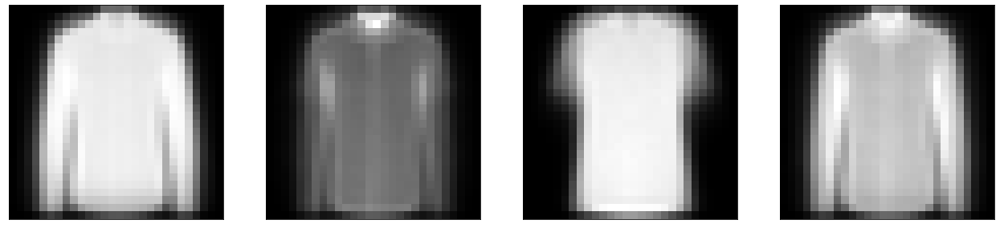

In [72]:
fig, ax = plt.subplots(1, 4, figsize=(22, 6))
for i in range(0,4):
        #First, reshape the flattened 64 pixel array into an 8-by-8 numpy array and unscale the data (ie. multiply by 255)
        object_image = np.array(df_centroids.iloc[i]).reshape((28, 28))*255
        
        #Then show the image
        ax[i].imshow(object_image, cmap='gray')
        ax[i].grid(False)
        ax[i].set_xticks([])
        ax[i].set_yticks([])
plt.show()

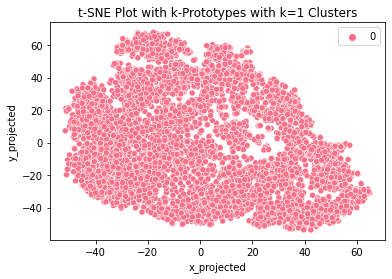

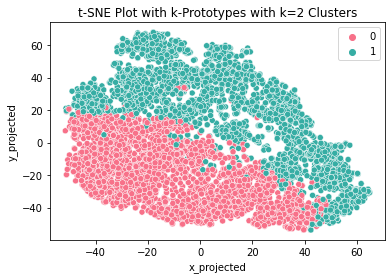

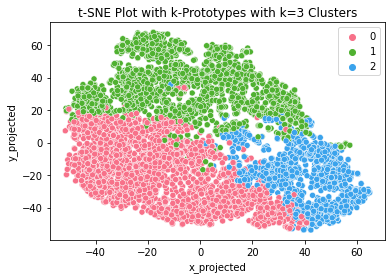

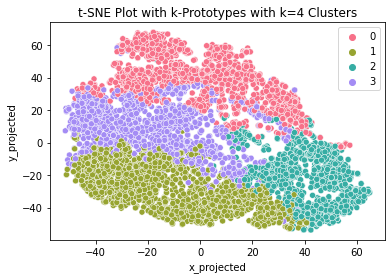

In [74]:
for k in list(range(1,5)):
    kmeans = KMeans(n_clusters=k, random_state=123).fit(label_6X)
    df_combo['predicted_cluster_kmeans']=kmeans.fit_predict(label_6X)
    sns.scatterplot(x='x_projected',y='y_projected', hue='predicted_cluster_kmeans', palette=sns.color_palette("husl", k), data=df_combo)
    plt.title('t-SNE Plot with k-Prototypes with k=%s Clusters' %(k))
    plt.legend(bbox_to_anchor=(1,1))
    plt.show()
    

### label 4

In [25]:
label_4 = train_stand[train_stand['label'] == 4]
label_4.drop(['predicted_cluster_kmeans'], 1, inplace = True)
label_4X = label_4.copy()
label_4X.drop(['label'], 1, inplace = True)


In [26]:
label_4X.reset_index(drop = True, inplace=True)
label_4.reset_index(drop = True, inplace=True)

k= 1
k= 2
k= 3
k= 4
k= 5
k= 6
k= 7


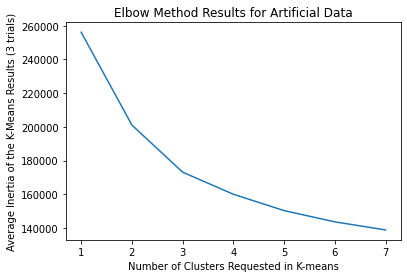

In [27]:
cluster_num_list=range(1,8)
avg_inertia_list=[]
for k in cluster_num_list:
    print('k= '+str(k))
    sub_inertia_list=[]   
    for i in range(0,3):
        kmeans=KMeans(n_clusters=k).fit(label_4X)
        sub_inertia_list.append(kmeans.inertia_)
    avg_inertia_list.append(np.average(sub_inertia_list))

plt.plot(cluster_num_list,avg_inertia_list)
plt.xlabel('Number of Clusters Requested in K-means')
plt.ylabel('Average Inertia of the K-Means Results (3 trials)')
plt.title('Elbow Method Results for Artificial Data')
plt.show()

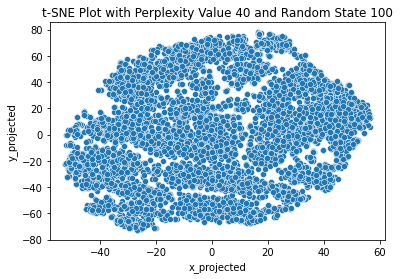

In [52]:
tsne = TSNE(n_components=2, perplexity=40, random_state=100)
data_tsne = tsne.fit_transform(label_4X)
df_tsne = pd.DataFrame(data_tsne, columns=['x_projected', 'y_projected'])
df_combo = pd.concat([label_4X, df_tsne], axis=1)
sns.scatterplot(x='x_projected',y='y_projected', data=df_combo)
plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' %(40, 100))
plt.show()

In [28]:
kmeans = KMeans(n_clusters=2, random_state=123).fit(label_4X)
df_centroids=pd.DataFrame(kmeans.cluster_centers_, columns = label_4X.columns)
df_centroids

,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,...,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
0,4.039731e-06,0.000003,0.000027,0.000112,0.000414,0.000522,0.001145,0.002729,0.006493,0.019667,...,0.104787,0.072877,0.050610,0.198272,0.342767,0.278615,0.112517,0.018736,0.002785,0.000139
1,-2.922264e-20,0.000002,0.000035,0.000056,0.000578,0.000737,0.001006,0.002073,0.004416,0.013137,...,0.112079,0.055550,0.033473,0.110600,0.152154,0.102883,0.037515,0.004259,0.000754,0.000024


In [29]:
label_4['predicted_cluster_kmeans'] = kmeans.fit_predict(label_4X)
label_4['sublabel'] = label_4['predicted_cluster_kmeans']
label_4.loc[(label_4['sublabel'] == 1), 'sublabel'] = '4-1'
label_4.loc[(label_4['sublabel'] == 0), 'sublabel'] = '4-0'
label_4

,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,...,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784,label,predicted_cluster_kmeans,sublabel
0,0.0,0.0,0.0,0.019608,0.015686,0.019608,0.019608,0.011765,0.019608,0.023529,...,0.015686,0.011765,0.027451,0.019608,0.000000,0.0,0.0,4,0,4-0
1,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,4,0,4-0
2,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.011765,0.007843,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,4,0,4-0
3,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.007843,0.000000,0.000000,0.000000,0.000000,0.0,0.0,4,1,4-1
4,0.0,0.0,0.0,0.000000,0.000000,0.003922,0.000000,0.003922,0.000000,0.000000,...,0.000000,0.239216,0.556863,0.270588,0.380392,0.0,0.0,4,0,4-0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5995,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,4,1,4-1
5996,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.450980,0.584314,0.278431,0.000000,0.000000,0.0,0.0,4,0,4-0
5997,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.160784,0.662745,0.552941,0.000000,0.000000,0.0,0.0,4,0,4-0
5998,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,4,1,4-1


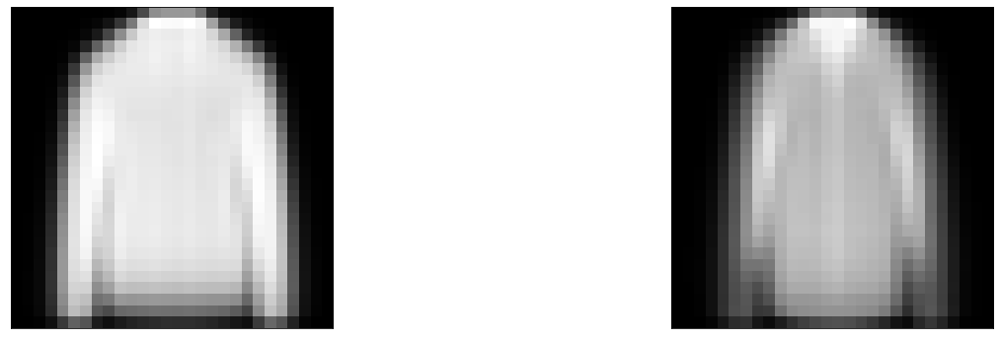

In [30]:
fig, ax = plt.subplots(1, 2, figsize=(22, 6))
for i in range(0,2):
        #First, reshape the flattened 64 pixel array into an 8-by-8 numpy array and unscale the data (ie. multiply by 255)
        object_image = np.array(df_centroids.iloc[i]).reshape((28, 28))*255
        
        #Then show the image
        ax[i].imshow(object_image, cmap='gray')
        ax[i].grid(False)
        ax[i].set_xticks([])
        ax[i].set_yticks([])
plt.show()

### label 7

In [53]:
label_7 = train_stand[train_stand['label'] == 7]
label_7.drop(['predicted_cluster_kmeans'], 1, inplace = True)
label_7X = label_7.copy()
label_7X.drop(['label'], 1, inplace = True)


In [54]:
label_7X.reset_index(drop = True, inplace=True)
label_7.reset_index(drop = True, inplace=True)

k= 1
k= 2
k= 3
k= 4
k= 5
k= 6
k= 7


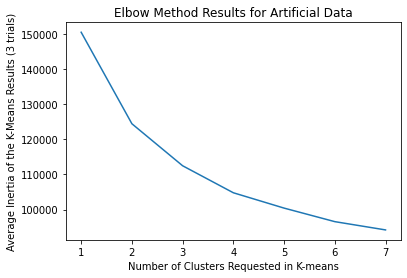

In [33]:
cluster_num_list=range(1,8)
avg_inertia_list=[]
for k in cluster_num_list:
    print('k= '+str(k))
    sub_inertia_list=[]   
    for i in range(0,3):
        kmeans=KMeans(n_clusters=k).fit(label_7X)
        sub_inertia_list.append(kmeans.inertia_)
    avg_inertia_list.append(np.average(sub_inertia_list))

plt.plot(cluster_num_list,avg_inertia_list)
plt.xlabel('Number of Clusters Requested in K-means')
plt.ylabel('Average Inertia of the K-Means Results (3 trials)')
plt.title('Elbow Method Results for Artificial Data')
plt.show()

In [55]:
kmeans = KMeans(n_clusters=2, random_state=123).fit(label_7X)
df_centroids=pd.DataFrame(kmeans.cluster_centers_, columns = label_7X.columns)
df_centroids

,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,...,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000034,0.000026,0.000031,0.000034,0.000037,0.000026,0.000028,0.000045,0.000037,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000067,0.000070,0.000067,0.000070,0.000084,0.000093,0.000107,0.000135,0.000166,0.0


In [56]:
label_7['predicted_cluster_kmeans'] = kmeans.fit_predict(label_7X)
label_7['sublabel'] = label_7['predicted_cluster_kmeans']
label_7.loc[(label_7['sublabel'] == 1), 'sublabel'] = '7-1'
label_7.loc[(label_7['sublabel'] == 0), 'sublabel'] = '7-0'
label_7

,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,...,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784,label,predicted_cluster_kmeans,sublabel
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7,0,7-0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7,0,7-0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7,1,7-1
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7,0,7-0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7,0,7-0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5995,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7,0,7-0
5996,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7,0,7-0
5997,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7,0,7-0
5998,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7,0,7-0


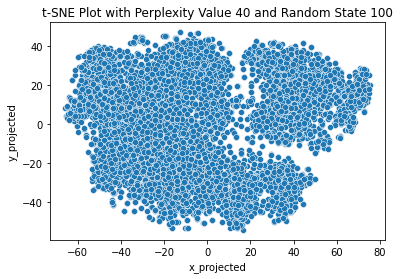

In [57]:
tsne = TSNE(n_components=2, perplexity=40, random_state=100)
data_tsne = tsne.fit_transform(label_7X)
df_tsne = pd.DataFrame(data_tsne, columns=['x_projected', 'y_projected'])
df_combo = pd.concat([label_7X, df_tsne], axis=1)
sns.scatterplot(x='x_projected',y='y_projected', data=df_combo)
plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' %(40, 100))
plt.show()

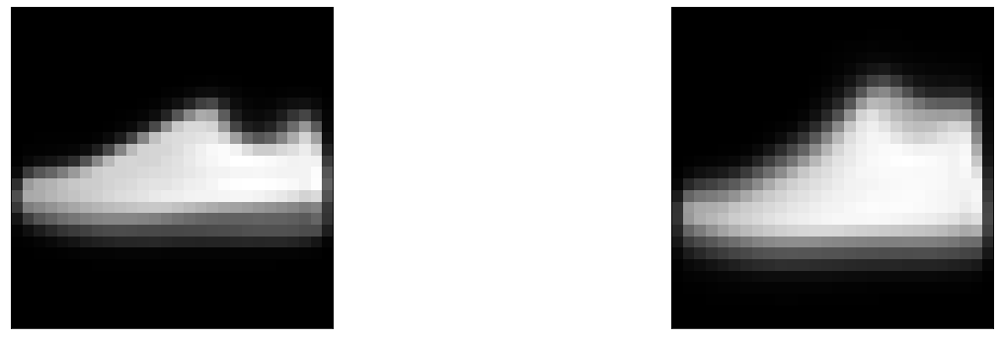

In [36]:
fig, ax = plt.subplots(1, 2, figsize=(22, 6))
for i in range(0,2):
        #First, reshape the flattened 64 pixel array into an 8-by-8 numpy array and unscale the data (ie. multiply by 255)
        object_image = np.array(df_centroids.iloc[i]).reshape((28, 28))*255
        
        #Then show the image
        ax[i].imshow(object_image, cmap='gray')
        ax[i].grid(False)
        ax[i].set_xticks([])
        ax[i].set_yticks([])
plt.show()

### label 9

In [58]:
label_9 = train_stand[train_stand['label'] == 9]
label_9.drop(['predicted_cluster_kmeans'], 1, inplace = True)
label_9X = label_9.copy()
label_9X.drop(['label'], 1, inplace = True)


In [59]:
label_9X.reset_index(drop = True, inplace=True)
label_9.reset_index(drop = True, inplace=True)
label_9

,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,...,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784,label
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5995,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9
5996,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9
5997,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9
5998,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9


k= 1
k= 2
k= 3
k= 4
k= 5
k= 6
k= 7


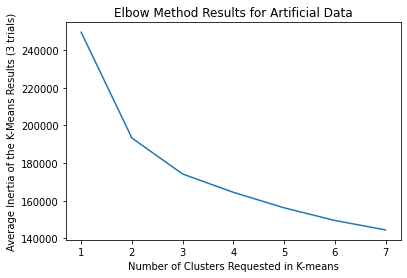

In [39]:
cluster_num_list=range(1,8)
avg_inertia_list=[]
for k in cluster_num_list:
    print('k= '+str(k))
    sub_inertia_list=[]   
    for i in range(0,3):
        kmeans=KMeans(n_clusters=k).fit(label_9X)
        sub_inertia_list.append(kmeans.inertia_)
    avg_inertia_list.append(np.average(sub_inertia_list))

plt.plot(cluster_num_list,avg_inertia_list)
plt.xlabel('Number of Clusters Requested in K-means')
plt.ylabel('Average Inertia of the K-Means Results (3 trials)')
plt.title('Elbow Method Results for Artificial Data')
plt.show()

In [60]:
kmeans = KMeans(n_clusters=2, random_state=123).fit(label_9X)
df_centroids=pd.DataFrame(kmeans.cluster_centers_, columns = label_9X.columns)
df_centroids

,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,...,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
0,0.0,0.000014,0.000014,0.000014,0.000014,0.000014,0.000014,0.000014,0.000014,0.000014,...,0.000017,0.000102,0.000250,0.000464,0.000831,0.000746,0.000652,0.000516,0.000404,0.000027
1,0.0,0.000075,0.000075,0.000075,0.000075,0.000076,0.000081,0.000081,0.000097,0.000276,...,0.004403,0.009554,0.022503,0.043328,0.070830,0.078341,0.067204,0.050750,0.025137,0.001917


In [61]:
label_9['predicted_cluster_kmeans'] = kmeans.fit_predict(label_9X)
label_9['sublabel'] = label_9['predicted_cluster_kmeans']
label_9.loc[(label_9['sublabel'] == 1), 'sublabel'] = '9-1'
label_9.loc[(label_9['sublabel'] == 0), 'sublabel'] = '9-0'
label_9

,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,...,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784,label,predicted_cluster_kmeans,sublabel
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9,0,9-0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9,1,9-1
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9,0,9-0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9,1,9-1
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9,0,9-0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5995,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9,0,9-0
5996,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9,0,9-0
5997,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9,0,9-0
5998,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9,1,9-1


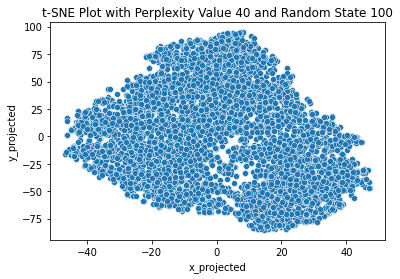

In [62]:
tsne = TSNE(n_components=2, perplexity=40, random_state=100)
data_tsne = tsne.fit_transform(label_9X)
df_tsne = pd.DataFrame(data_tsne, columns=['x_projected', 'y_projected'])
df_combo = pd.concat([label_9X, df_tsne], axis=1)
sns.scatterplot(x='x_projected',y='y_projected', data=df_combo)
plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' %(40, 100))
plt.show()

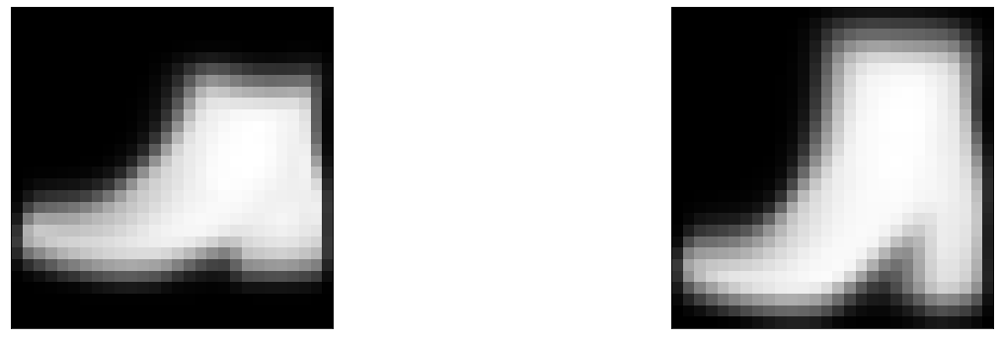

In [42]:
fig, ax = plt.subplots(1, 2, figsize=(22, 6))
for i in range(0,2):
        #First, reshape the flattened 64 pixel array into an 8-by-8 numpy array and unscale the data (ie. multiply by 255)
        object_image = np.array(df_centroids.iloc[i]).reshape((28, 28))*255
        
        #Then show the image
        ax[i].imshow(object_image, cmap='gray')
        ax[i].grid(False)
        ax[i].set_xticks([])
        ax[i].set_yticks([])
plt.show()

## Trying NMF when k = 10

In [8]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from sklearn.datasets import load_digits
from sklearn.decomposition import NMF
import warnings

from sklearn.manifold import TSNE

warnings.simplefilter(action='ignore', category=FutureWarning)


from warnings import simplefilter
from sklearn.exceptions import ConvergenceWarning
simplefilter("ignore", category=ConvergenceWarning)


In [33]:
# Perform a Non-negative matrix factorization
nmf = NMF(n_components=10, random_state=100)
W=nmf.fit_transform(X)
H=nmf.components_

In [35]:
df_W=pd.DataFrame(W, columns=['image_cluster_'+str(k) for k in range(0,10)])
df_W.round(4)

,image_cluster_0,image_cluster_1,image_cluster_2,image_cluster_3,image_cluster_4,image_cluster_5,image_cluster_6,image_cluster_7,image_cluster_8,image_cluster_9
0,0.0937,0.1947,0.1000,0.0404,0.0535,0.0186,0.0143,0.0675,0.0000,0.2236
1,0.0031,0.2809,0.0000,0.0000,0.0105,0.0000,0.0063,0.1782,0.0000,0.0000
2,0.0903,0.0000,0.1880,0.0000,0.1843,0.0761,0.1301,0.0000,0.0475,0.0002
3,0.0839,0.0189,0.0000,0.0000,0.1970,0.2237,0.0000,0.0000,0.0349,0.0147
4,0.1704,0.0000,0.0937,0.0000,0.0950,0.0352,0.0000,0.0000,0.1948,0.0096
...,...,...,...,...,...,...,...,...,...,...
59995,0.1024,0.2280,0.0130,0.2918,0.0000,0.0006,0.0000,0.0000,0.0000,0.0000
59996,0.0000,0.0000,0.0000,0.0000,0.0677,0.0000,0.0008,0.0000,0.2449,0.0000
59997,0.0814,0.0066,0.0866,0.0000,0.3246,0.0000,0.0651,0.1073,0.0000,0.0000
59998,0.0185,0.1445,0.0039,0.1746,0.1286,0.0000,0.0872,0.0892,0.0000,0.1824


In [36]:
cm_scores_W=W/np.sum(W, axis=1, keepdims=True)
cm_scores_W

array([[1.16245020e-01, 2.41462134e-01, 1.24029276e-01, ...,
        8.37586601e-02, 0.00000000e+00, 2.77225880e-01],
       [6.48248208e-03, 5.86420528e-01, 0.00000000e+00, ...,
        3.72016841e-01, 0.00000000e+00, 0.00000000e+00],
       [1.26023877e-01, 0.00000000e+00, 2.62361126e-01, ...,
        0.00000000e+00, 6.63023006e-02, 3.47616259e-04],
       ...,
       [1.21201193e-01, 9.84111795e-03, 1.28956403e-01, ...,
        1.59746222e-01, 0.00000000e+00, 0.00000000e+00],
       [2.23578988e-02, 1.74350359e-01, 4.69948059e-03, ...,
        1.07609780e-01, 0.00000000e+00, 2.20005458e-01],
       [8.67145495e-03, 1.50356744e-01, 0.00000000e+00, ...,
        7.26316057e-01, 0.00000000e+00, 1.07456969e-01]])

In [37]:
df_cm_scores_W=pd.DataFrame(cm_scores_W, columns=df_W.columns)
df_cm_scores_W

,image_cluster_0,image_cluster_1,image_cluster_2,image_cluster_3,image_cluster_4,image_cluster_5,image_cluster_6,image_cluster_7,image_cluster_8,image_cluster_9
0,0.116245,0.241462,0.124029,0.050153,0.066345,0.023076,0.017705,0.083759,0.000000,0.277226
1,0.006482,0.586421,0.000000,0.000000,0.021900,0.000000,0.013180,0.372017,0.000000,0.000000
2,0.126024,0.000000,0.262361,0.000000,0.257267,0.106183,0.181516,0.000000,0.066302,0.000348
3,0.146369,0.032945,0.000000,0.000000,0.343732,0.390305,0.000000,0.000000,0.060944,0.025705
4,0.284706,0.000000,0.156474,0.000000,0.158636,0.058761,0.000000,0.000000,0.325387,0.016036
...,...,...,...,...,...,...,...,...,...,...
59995,0.161126,0.358650,0.020388,0.458897,0.000000,0.000939,0.000000,0.000000,0.000000,0.000000
59996,0.000000,0.000000,0.000000,0.000000,0.216047,0.000000,0.002618,0.000000,0.781336,0.000000
59997,0.121201,0.009841,0.128956,0.000000,0.483382,0.000000,0.096873,0.159746,0.000000,0.000000
59998,0.022358,0.174350,0.004699,0.210650,0.155137,0.000000,0.105190,0.107610,0.000000,0.220005


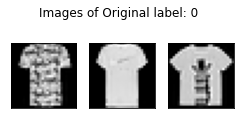

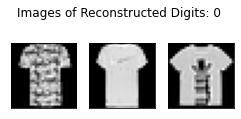

-------------------------------


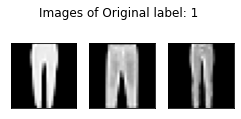

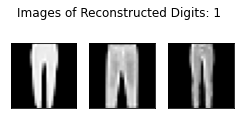

-------------------------------


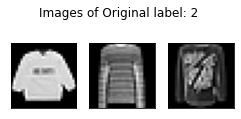

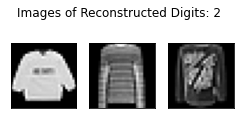

-------------------------------


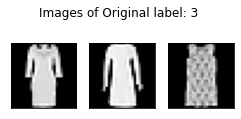

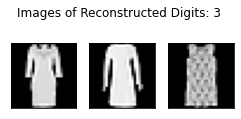

-------------------------------


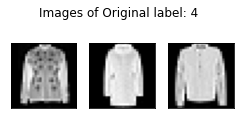

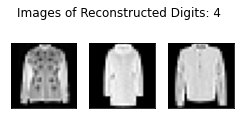

-------------------------------


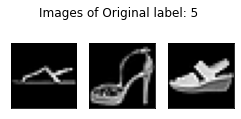

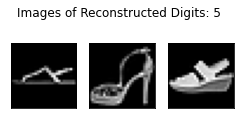

-------------------------------


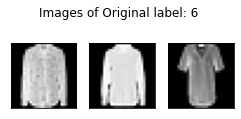

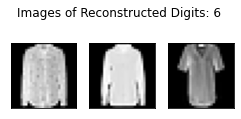

-------------------------------


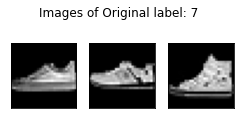

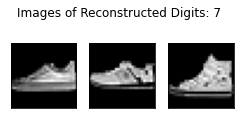

-------------------------------


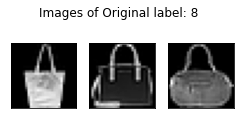

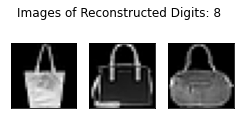

-------------------------------


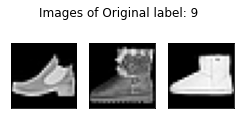

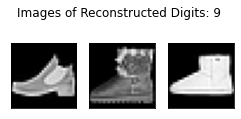

-------------------------------


In [38]:
for label in range(0,10):

    #ORIGINAL IMAGES
    #Find just the rows in X that are an image of this particular digit
    df_label_subset=X[train['label']==label]
    
    #Set up the plot
    fig, ax = plt.subplots(1, 3, figsize=(4, 2))
    plt.suptitle('Images of Original label: '+ str(label))
    
    #Visualize the first three images that are of this digit
    for i in range(0,3):
        #First, reshape the flattened 64 pixel array into an 8-by-8 numpy array and unscale the data (ie. multiply by 255)
        object_image = np.array(df_label_subset.iloc[i]).reshape((28, 28))*255
        
        #Then show the image
        ax[i].imshow(object_image, cmap='gray')
        ax[i].grid(False)
        ax[i].set_xticks([])
        ax[i].set_yticks([])
    plt.show()
    

    #RECONSTRUCTED IMAGES
    #Find just the rows in X that are an image of this particular digit
    dflabel_subset=df_Y[train['label']==label]
    
    #Set up the plot
    fig, ax = plt.subplots(1, 3, figsize=(4, 2))
    plt.suptitle('Images of Reconstructed Digits: '+ str(label))
    
    #Visualize the first three images that are of this digit
    for i in range(0,3):
        #First, reshape the flattened 64 pixel array into an 8-by-8 numpy array and unscale the data (ie. multiply by 255)
        object_image = np.array(df_label_subset.iloc[i]).reshape((28, 28))*255
        
        #Then show the image
        ax[i].imshow(object_image, cmap='gray')
        ax[i].grid(False)
        ax[i].set_xticks([])
        ax[i].set_yticks([])
    plt.show()
    print('-------------------------------')

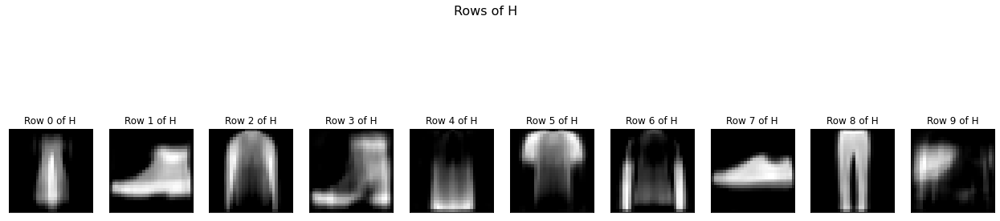

In [15]:
fig, ax = plt.subplots(1, 10, figsize=(22, 6))
fig.suptitle('Rows of H', fontsize=16)
for i in range(10):
    ax[i].imshow(H[i,:].reshape((28, 28)), cmap='gray')
    ax[i].set_xticks([])
    ax[i].set_yticks([])
    ax[i].set_title('Row %s of H'%str(i))

plt.show()

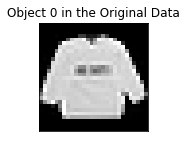

In [16]:
fig, ax = plt.subplots(1, 1, figsize=(2, 2))
ax.imshow(np.array(X.iloc[0,:]).reshape((28, 28)), cmap='gray')
ax.set_xticks([])
ax.set_yticks([])
ax.set_title('Object 0 in the Original Data')
plt.show()

In [17]:
df_W.iloc[0,:]

image_cluster_0    0.093739
image_cluster_1    0.194712
image_cluster_2    0.100016
image_cluster_3    0.040443
image_cluster_4    0.053500
image_cluster_5    0.018609
image_cluster_6    0.014277
image_cluster_7    0.067542
image_cluster_8    0.000000
image_cluster_9    0.223552
Name: 0, dtype: float64

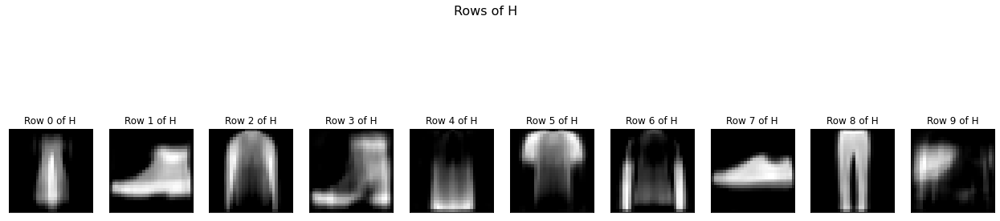

In [19]:
fig, ax = plt.subplots(1, 10, figsize=(22, 6))
fig.suptitle('Rows of H', fontsize=16)
for i in range(10):
    ax[i].imshow(H[i,:].reshape((28, 28)), cmap='gray')
    ax[i].set_xticks([])
    ax[i].set_yticks([])
    ax[i].set_title('Row %s of H'%str(i))

plt.show()

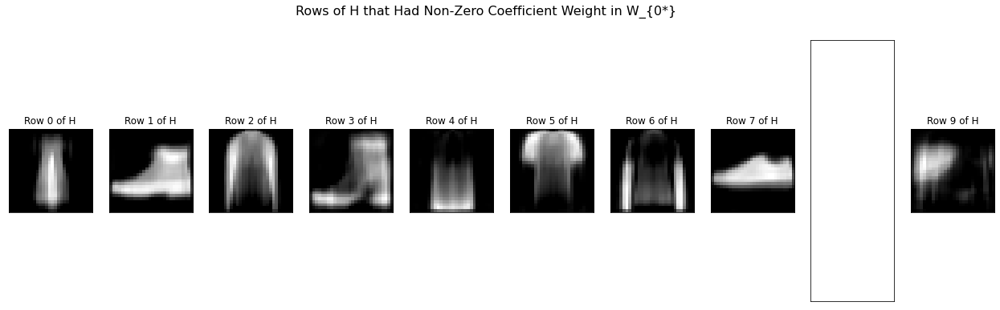

In [20]:
fig, ax = plt.subplots(1, 10, figsize=(22, 6))
fig.suptitle('Rows of H that Had Non-Zero Coefficient Weight in W_{0*}', fontsize=16)
for i in range(10):
    if df_W.iloc[0,i]>0:
        ax[i].imshow(H[i,:].reshape((28, 28)), cmap='gray')
        ax[i].set_xticks([])
        ax[i].set_yticks([])
        ax[i].set_title('Row %s of H'%str(i))
    else:
        ax[i].set_xticks([])
        ax[i].set_yticks([])
        

plt.show()

## Trying NMF when k = 20

In [21]:
# Perform a Non-negative matrix factorization
nmf = NMF(n_components=20, random_state=100)
W=nmf.fit_transform(X)
H=nmf.components_

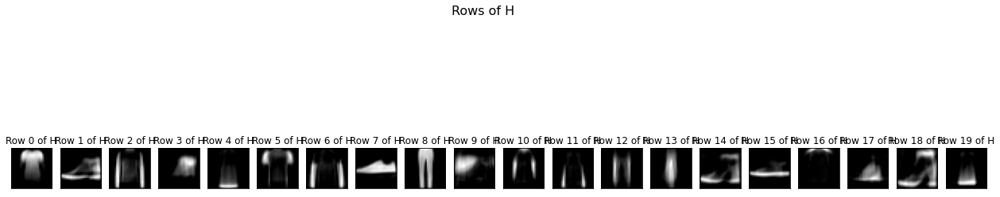

In [24]:
fig, ax = plt.subplots(1, 20, figsize=(22, 6))
fig.suptitle('Rows of H', fontsize=16)
for i in range(20):
    ax[i].imshow(H[i,:].reshape((28, 28)), cmap='gray')
    ax[i].set_xticks([])
    ax[i].set_yticks([])
    ax[i].set_title('Row %s of H'%str(i))

plt.show()

In [25]:
df_W=pd.DataFrame(W, columns=['image_cluster_'+str(k) for k in range(0,20)])
df_W.round(4)

,image_cluster_0,image_cluster_1,image_cluster_2,image_cluster_3,image_cluster_4,image_cluster_5,image_cluster_6,image_cluster_7,image_cluster_8,image_cluster_9,image_cluster_10,image_cluster_11,image_cluster_12,image_cluster_13,image_cluster_14,image_cluster_15,image_cluster_16,image_cluster_17,image_cluster_18,image_cluster_19
0,0.1354,0.1320,0.0117,0.0902,0.0000,0.0328,0.0198,0.0779,0.0000,0.2320,0.0107,0.0566,0.0000,0.0000,0.0539,0.1876,0.0000,0.0685,0.0000,0.1106
1,0.0000,0.1785,0.0000,0.0745,0.0000,0.0000,0.0044,0.1096,0.0000,0.0000,0.0021,0.0062,0.0090,0.0000,0.0782,0.1529,0.0000,0.1717,0.0000,0.0000
2,0.1737,0.0000,0.1972,0.0000,0.1455,0.0454,0.0020,0.0111,0.0195,0.0000,0.0581,0.0839,0.0449,0.1839,0.0000,0.0041,0.0179,0.0381,0.0000,0.0615
3,0.0427,0.0000,0.0000,0.0497,0.0995,0.1839,0.0000,0.0000,0.0384,0.0000,0.0136,0.0306,0.0871,0.3506,0.0000,0.0101,0.0577,0.0000,0.0000,0.0450
4,0.1734,0.0000,0.0000,0.0000,0.1371,0.0000,0.0000,0.0094,0.0485,0.0121,0.0582,0.0000,0.0517,0.4251,0.0000,0.0000,0.0225,0.0047,0.0000,0.0641
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59995,0.0430,0.0515,0.0000,0.2371,0.0000,0.0043,0.0000,0.0000,0.0000,0.0000,0.0000,0.0138,0.0000,0.1133,0.3280,0.0075,0.0000,0.1928,0.0466,0.0472
59996,0.0000,0.0000,0.0000,0.0000,0.0623,0.0000,0.0000,0.0000,0.2181,0.0004,0.0000,0.0000,0.0030,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0237
59997,0.0000,0.0000,0.0794,0.0000,0.1812,0.0000,0.0000,0.0488,0.0000,0.0000,0.0430,0.1327,0.0732,0.3591,0.0000,0.0329,0.0000,0.1064,0.0000,0.0526
59998,0.0000,0.1126,0.0208,0.0460,0.0000,0.0000,0.0846,0.0799,0.0004,0.1659,0.0187,0.0620,0.0272,0.0180,0.1258,0.0951,0.0102,0.1085,0.0631,0.1021


In [26]:
Y=np.dot(W,H)
df_Y=pd.DataFrame(Y, columns=X.columns)

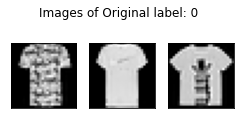

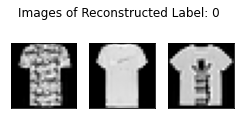

-------------------------------


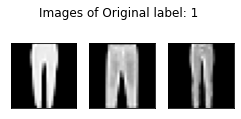

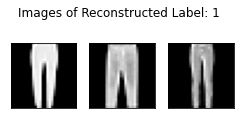

-------------------------------


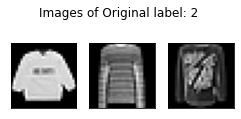

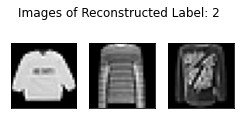

-------------------------------


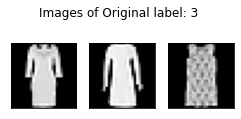

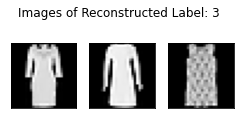

-------------------------------


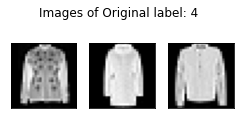

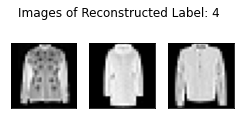

-------------------------------


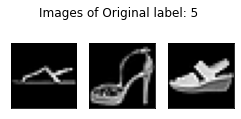

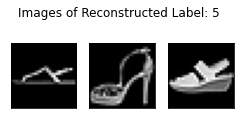

-------------------------------


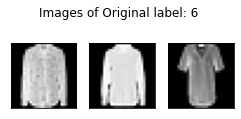

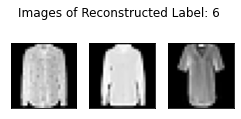

-------------------------------


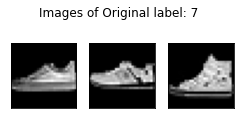

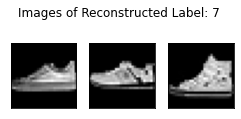

-------------------------------


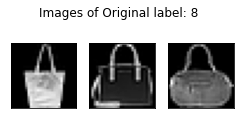

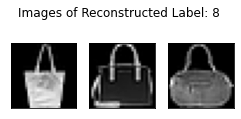

-------------------------------


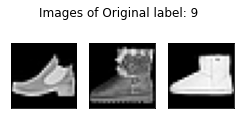

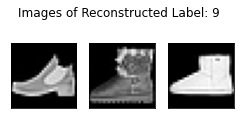

-------------------------------


IndexError: single positional indexer is out-of-bounds

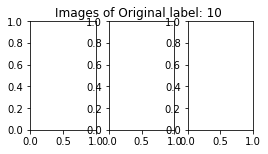

In [43]:
for label in range(0,20):

    #ORIGINAL IMAGES
    #Find just the rows in X that are an image of this particular digit
    df_label_subset=X[train['label']==label]
    
    #Set up the plot
    fig, ax = plt.subplots(1, 3, figsize=(4, 2))
    plt.suptitle('Images of Original label: '+ str(label))
    
    #Visualize the first three images that are of this digit
    for i in range(0,3):
        #First, reshape the flattened 64 pixel array into an 8-by-8 numpy array and unscale the data (ie. multiply by 255)
        object_image = np.array(df_label_subset.iloc[i]).reshape((28, 28))*255
        
        #Then show the image
        ax[i].imshow(object_image, cmap='gray')
        ax[i].grid(False)
        ax[i].set_xticks([])
        ax[i].set_yticks([])
    plt.show()
    

    #RECONSTRUCTED IMAGES
    #Find just the rows in X that are an image of this particular digit
    dflabel_subset=df_Y[train['label']==label]
    
    #Set up the plot
    fig, ax = plt.subplots(1, 3, figsize=(4, 2))
    plt.suptitle('Images of Reconstructed Label: '+ str(label))
    
    #Visualize the first three images that are of this digit
    for i in range(0,3):
        #First, reshape the flattened 64 pixel array into an 8-by-8 numpy array and unscale the data (ie. multiply by 255)
        object_image = np.array(df_label_subset.iloc[i]).reshape((28, 28))*255
        
        #Then show the image
        ax[i].imshow(object_image, cmap='gray')
        ax[i].grid(False)
        ax[i].set_xticks([])
        ax[i].set_yticks([])
    plt.show()
    print('-------------------------------')

## k = 5

In [39]:
# Perform a Non-negative matrix factorization
nmf = NMF(n_components=5, random_state=100)
W=nmf.fit_transform(X)
H=nmf.components_

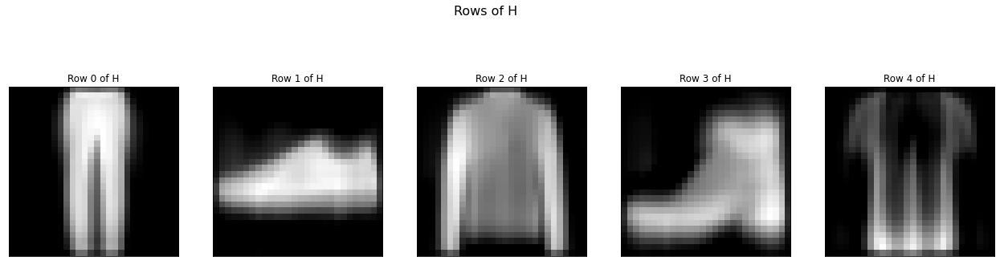

In [40]:
fig, ax = plt.subplots(1, 5, figsize=(22, 6))
fig.suptitle('Rows of H', fontsize=16)
for i in range(5):
    ax[i].imshow(H[i,:].reshape((28, 28)), cmap='gray')
    ax[i].set_xticks([])
    ax[i].set_yticks([])
    ax[i].set_title('Row %s of H'%str(i))

plt.show()

In [41]:
df_W=pd.DataFrame(W, columns=['image_cluster_'+str(k) for k in range(0,5)])
df_W.round(4)

,image_cluster_0,image_cluster_1,image_cluster_2,image_cluster_3,image_cluster_4
0,0.0449,0.1872,0.1642,0.0940,0.0715
1,0.0000,0.2005,0.0000,0.2046,0.0000
2,0.0865,0.0057,0.2513,0.0000,0.1704
3,0.1359,0.0000,0.0514,0.0181,0.2201
4,0.2321,0.0177,0.0323,0.0000,0.1389
...,...,...,...,...,...
59995,0.0518,0.0000,0.0009,0.4807,0.0141
59996,0.1349,0.0000,0.0000,0.0000,0.0317
59997,0.0674,0.1327,0.0361,0.0178,0.2739
59998,0.0000,0.1389,0.1075,0.2250,0.0979


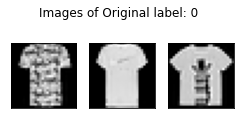

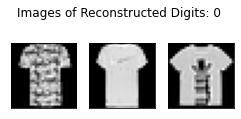

-------------------------------


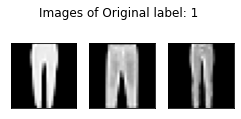

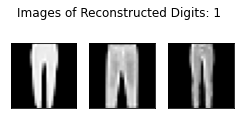

-------------------------------


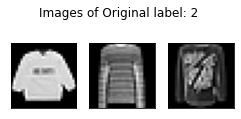

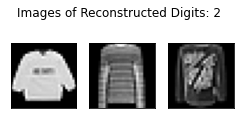

-------------------------------


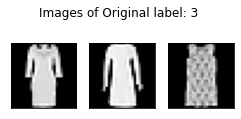

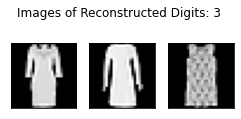

-------------------------------


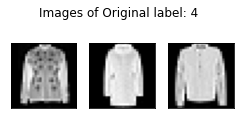

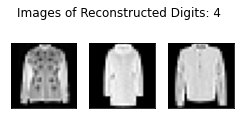

-------------------------------


In [42]:
for label in range(0,5):

    #ORIGINAL IMAGES
    #Find just the rows in X that are an image of this particular digit
    df_label_subset=X[train['label']==label]
    
    #Set up the plot
    fig, ax = plt.subplots(1, 3, figsize=(4, 2))
    plt.suptitle('Images of Original label: '+ str(label))
    
    #Visualize the first three images that are of this digit
    for i in range(0,3):
        #First, reshape the flattened 64 pixel array into an 8-by-8 numpy array and unscale the data (ie. multiply by 255)
        object_image = np.array(df_label_subset.iloc[i]).reshape((28, 28))*255
        
        #Then show the image
        ax[i].imshow(object_image, cmap='gray')
        ax[i].grid(False)
        ax[i].set_xticks([])
        ax[i].set_yticks([])
    plt.show()
    

    #RECONSTRUCTED IMAGES
    #Find just the rows in X that are an image of this particular digit
    dflabel_subset=df_Y[train['label']==label]
    
    #Set up the plot
    fig, ax = plt.subplots(1, 3, figsize=(4, 2))
    plt.suptitle('Images of Reconstructed Digits: '+ str(label))
    
    #Visualize the first three images that are of this digit
    for i in range(0,3):
        #First, reshape the flattened 64 pixel array into an 8-by-8 numpy array and unscale the data (ie. multiply by 255)
        object_image = np.array(df_label_subset.iloc[i]).reshape((28, 28))*255
        
        #Then show the image
        ax[i].imshow(object_image, cmap='gray')
        ax[i].grid(False)
        ax[i].set_xticks([])
        ax[i].set_yticks([])
    plt.show()
    print('-------------------------------')